# Plots

In [3]:
import numpy as np
import seaborn as sns
import os
from matplotlib import pyplot as plt
import pickle
import pandas as pd

from helpers_models import model_config_from_experiment
from cpsmehelper import export_figure
from plotting import (
    plot_loss_histories,
    plot_property_histories,
    plot_violin_comparison,
    plot_property_histories_till_best,
    plot_loss_histories,
    plot_loss_histories_till_best,
)


# Add the directory containing the style file to the matplotlib style path
plt.style.use(os.path.join(os.getcwd(), "AIP_journal.mplstyle"))
FIGURE_PATH = os.path.join(os.getcwd(), "figures")

# Select the case to analyse
CASE = "all"  # give a specific case name or "all" to analyse all cases

# Load the data
def load_data(CASE):
    SAVE_NAME = f"{CASE}.pkl"
    SAVE_PATH = os.path.join(os.getcwd(), "stored_results", SAVE_NAME)

    # load experiment configuration
    # Define RC properties for the models that will later be pruned
    rc_config = model_config_from_experiment(experiment_name=CASE)
    dataset = rc_config["dataset"]
    identifier = rc_config["identifier"]
    DATA_FILE = os.path.join(os.getcwd(), "stored_results", f"{CASE}.pkl")

    # load data
    with open(DATA_FILE, "rb") as file:
        data = pickle.load(file)    
    return data

In [4]:
def plot_pruning_histories_all(case_group, X_quantity, Y_quantity, title, case_colors, final_markers, legend_names, marker_size=80, save_fig=False):
    """Plots pruning histories for a given NARMA case group with improved font sizes and larger axis ticks."""
        
    fig, ax = plt.subplots(figsize=(8, 8))
    
    for CASE in case_group:
        color = case_colors.get(CASE, "black")  # Default to black if not found
        final_marker = final_markers.get(CASE, "+")  # Default to plus if not found
        data = load_data(CASE)

        fig_case = plot_property_histories(data["pruning_histories"], x_quantity=X_quantity, y_quantity=Y_quantity)
        case_ax = fig_case.axes[0]  # Extract the axis from the returned figure

        lines = case_ax.get_lines()
        for i, line in enumerate(lines):
            if i % 5 != 0:  # Skip every second line
                continue

            x_data = line.get_xdata()[::1]
            y_data = line.get_ydata()[::1]
            # 1️⃣ Plot **faded lines** without markers
            ax.plot(x_data, y_data, linestyle=line.get_linestyle(), color=color, alpha=0.2, linewidth=1, zorder=1)

        fig_case = plot_property_histories_till_best(data["pruning_histories"], x_quantity=X_quantity, y_quantity=Y_quantity)
        case_ax = fig_case.axes[0]  # Extract the axis from the returned figure

        lines = case_ax.get_lines()
        for i, line in enumerate(lines):
            if i % 5 != 0:  # Skip every second line
                continue

            x_data = line.get_xdata()[::1]
            y_data = line.get_ydata()[::1]

            if len(x_data) < 2:
                continue  # Skip cases where we don't have enough points

            first_x, first_y = x_data[0], y_data[0]
            last_x, last_y = x_data[-1], y_data[-1]

            # 2️⃣ Plot **initial marker** (○) ONLY IF IT'S NOT OVERLAPPING FINAL
            if first_x != last_x or first_y != last_y:
                ax.scatter(first_x, first_y, marker="o", facecolors="none", edgecolors=color, s=marker_size * 0.6, alpha=1.0, zorder=3)

            # 3️⃣ Plot **final marker**
            ax.scatter(last_x, last_y, marker=final_marker, color=color, s=marker_size, alpha=1.0, zorder=4)

        plt.close(fig_case)  

    # **Custom legend (ONLY Initial and Final Net)**
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color="black", markerfacecolor="none", linestyle="None", markersize=18, label="Initial Networks"),
    ]
    
    for CASE in case_group:
        legend_elements.append(
            plt.Line2D([0], [0], marker=final_markers.get(CASE, "+"), color=case_colors.get(CASE, "black"), linestyle="None", markersize=18, label=legend_names.get(CASE, CASE))
        )

    ax.set_xlabel(X_quantity, fontsize=28)
    ax.set_ylabel(Y_quantity, fontsize=28)    
    ax.tick_params(axis="both", which="major", labelsize=20) 
    ax.legend(handles=legend_elements, loc="best", fontsize=20)

    # **Save Figure Option**
    if save_fig:
        os.makedirs(FIGURE_PATH, exist_ok=True)  # Ensure directory exists
        fig.savefig(os.path.join(FIGURE_PATH, f"{title}_pruning_{Y_quantity}_all.svg"), dpi=300, bbox_inches="tight")
        print(f"Figure saved as '{title}_pruning_{Y_quantity}_all.svg'")

    plt.show()




def plot_pruning_loss_histories_all(case_group, X_quantity, title, case_colors, final_markers, legend_names, marker_size=80, save_fig=False):
    """Plots pruning histories for a given NARMA case group with improved font sizes and larger axis ticks."""
        
    fig, ax = plt.subplots(figsize=(8, 5))
    
    for CASE in case_group:
        color = case_colors.get(CASE, "black")  # Default to black if not found
        final_marker = final_markers.get(CASE, "+")  # Default to plus if not found
        data = load_data(CASE)

        fig_case = plot_loss_histories(data["pruning_histories"], x_quantity=X_quantity)
        case_ax = fig_case.axes[0]  # Extract the axis from the returned figure

        lines = case_ax.get_lines()
        for i, line in enumerate(lines):
            if i % 2 != 0:  # Skip every second line
                continue

            x_data = line.get_xdata()[::1]
            y_data = line.get_ydata()[::1]
            # 1️⃣ Plot **faded lines** without markers
            ax.plot(x_data, y_data, linestyle=line.get_linestyle(), color=color, alpha=0.4, linewidth=1, zorder=1)

        fig_case = plot_loss_histories_till_best(data["pruning_histories"], x_quantity=X_quantity)
        case_ax = fig_case.axes[0]  # Extract the axis from the returned figure
        
        lines = case_ax.get_lines()
        for i, line in enumerate(lines):
            if i % 2 != 0:  # Skip every second line
                continue

            x_data = line.get_xdata()[::1]
            y_data = line.get_ydata()[::1]

            if len(x_data) < 2:
                continue  # Skip cases where we don't have enough points

            first_x, first_y = x_data[0], y_data[0]
            last_x, last_y = x_data[-1], y_data[-1]

            # 2️⃣ Plot **initial marker** (○) ONLY IF IT'S NOT OVERLAPPING FINAL
            if first_x != last_x or first_y != last_y:
                ax.scatter(first_x, first_y, marker="o", facecolors="none", edgecolors=color, s=marker_size * 0.6, alpha=1.0, zorder=3)

            # 3️⃣ Plot **final marker**
            ax.scatter(last_x, last_y, marker=final_marker, color=color, s=marker_size, alpha=1.0, zorder=4)

        plt.close(fig_case)  

    # **Custom legend (ONLY Initial and Final Net)**
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color="black", markerfacecolor="none", linestyle="None", markersize=18, label="Initial Networks"),
    ]
    
    for CASE in case_group:
        legend_elements.append(
            plt.Line2D([0], [0], marker=final_markers.get(CASE, "+"), color=case_colors.get(CASE, "black"), linestyle="None", markersize=18, label=legend_names.get(CASE, CASE))
        )

    ax.set_yscale('log')
    ax.set_xlabel(X_quantity, fontsize=28)
    ax.set_ylabel('loss', fontsize=28)    
    ax.tick_params(axis="both", which="major", labelsize=20) 
    ax.tick_params(axis='y', labelsize=25)
    ax.legend(handles=legend_elements, loc="best", fontsize=20)

    # **Save Figure Option**
    if save_fig:
        os.makedirs(FIGURE_PATH, exist_ok=True)  # Ensure directory exists
        fig.savefig(os.path.join(FIGURE_PATH, f"pruning_loss_all_{title}.svg"), dpi=300, bbox_inches="tight")
        print(f"Figure saved as 'pruning_loss_all_{title}.svg'")

    plt.show()

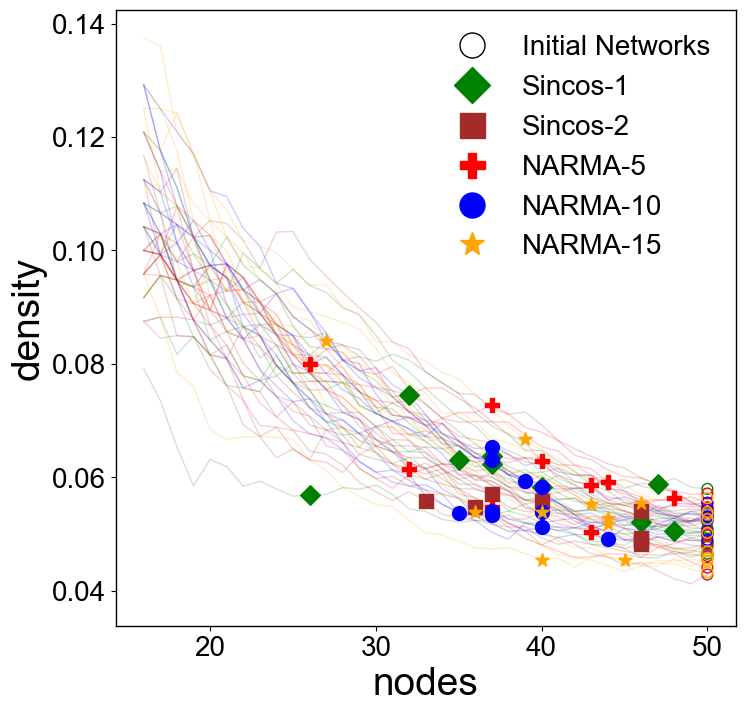

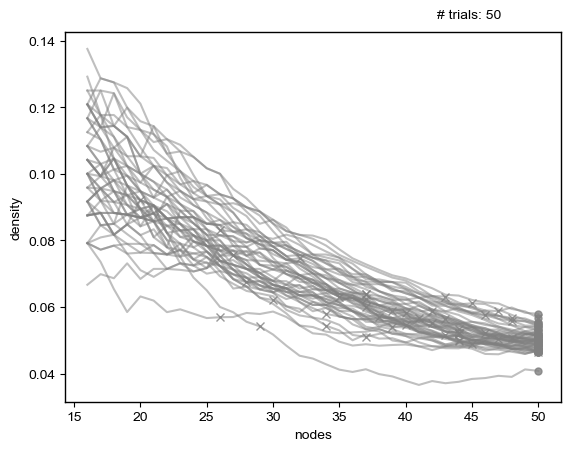

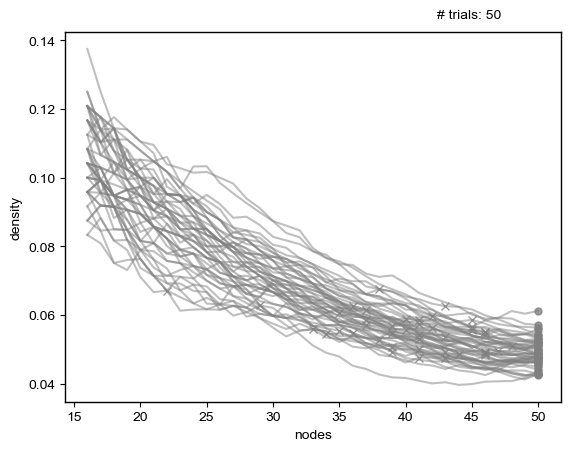

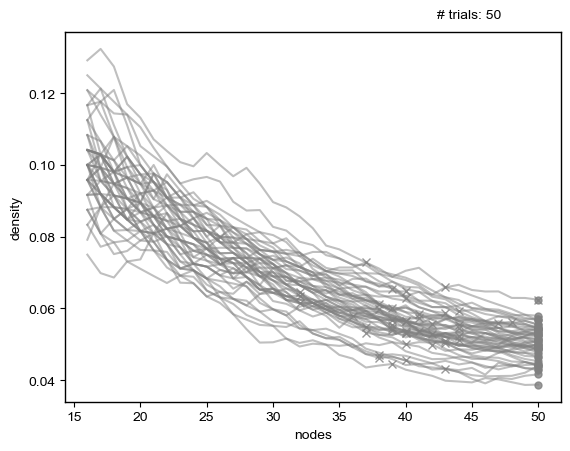

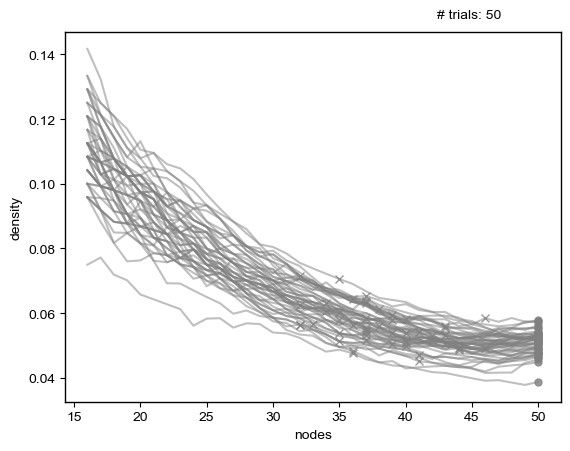

...

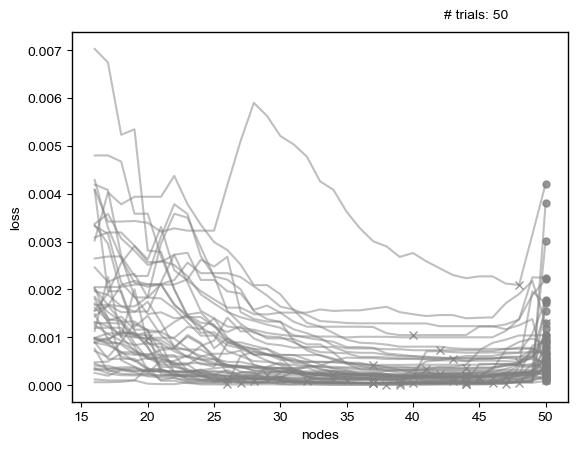

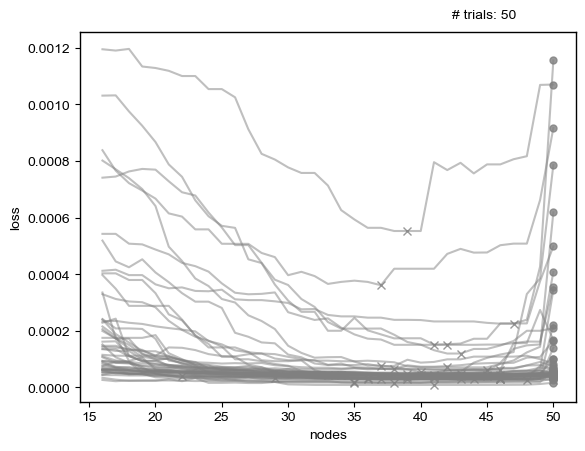

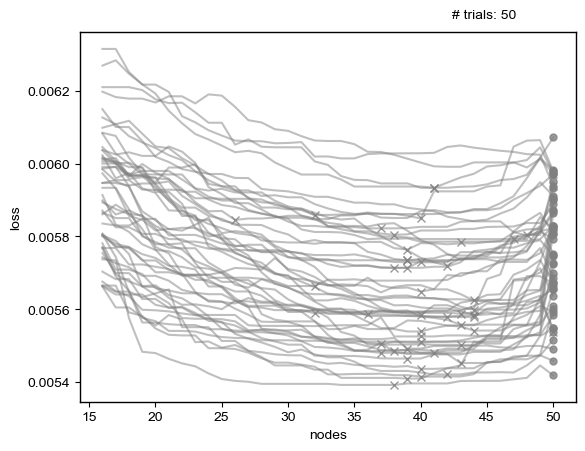

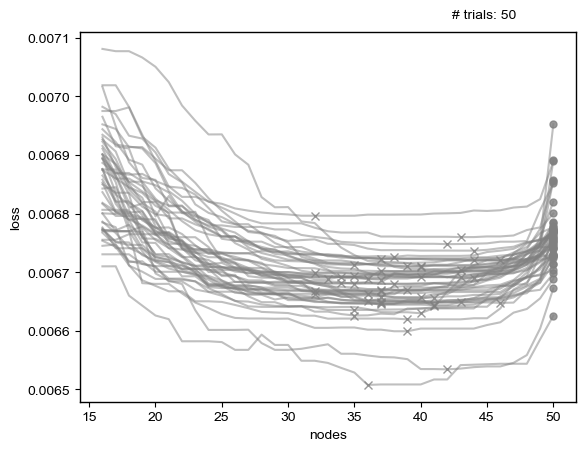

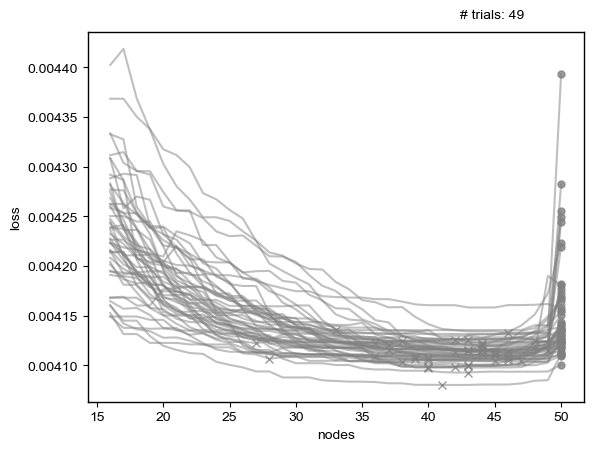

In [3]:
case_colors = {
        "SC1A1": "#008000",  # Green
        "SC3A1": "#a52a2a",  # Brown
        "N5A1": "#ff0000",   # Red
        "N10A1": "#0000ff",  # Blue
        "N15A1": "#ffa500",  # Orange
    }
    
final_markers = {
    "SC1A1": "D",  # Diamond
    "SC3A1": "s",  # Square
    "N5A1": "P",  # Plus
    "N10A1": "o",  # Filled Circle
    "N15A1": "*",  # Star
}

legend_names = {
    "SC1A1": "Sincos-1",
    "SC3A1": "Sincos-2",
    "N5A1": "NARMA-5",
    "N10A1": "NARMA-10",
    "N15A1": "NARMA-15",
}


plot_pruning_histories_all(case_group=["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"],
    X_quantity="nodes", Y_quantity="density", title="Sincos-1", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["SC1A1"],
    X_quantity="nodes", title="Sincos-1", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["SC3A1"],
    X_quantity="nodes", title="Sincos-2", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["N5A1"],
    X_quantity="nodes", title="NARMA-5", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["N10A1"],
    X_quantity="nodes", title="NARMA-10", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["N15A1"],
    X_quantity="nodes", title="NARMA-15", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"],
    X_quantity="nodes", title="Sincos-1", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

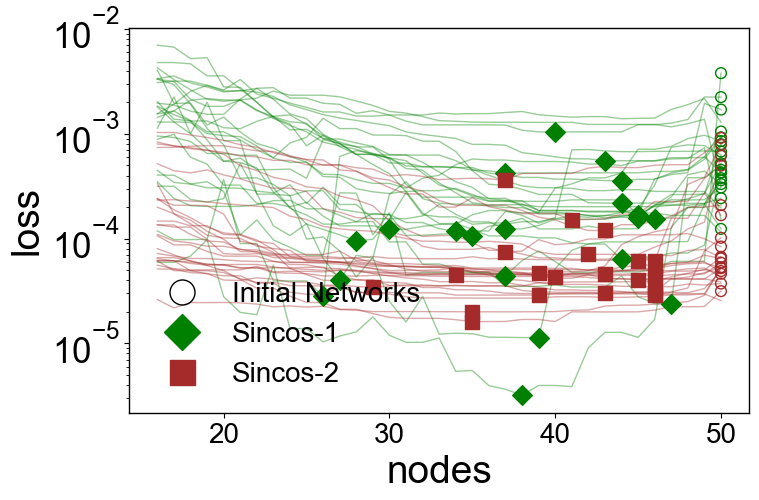

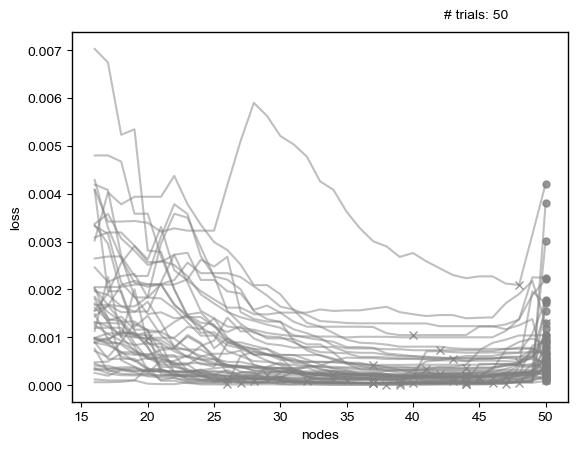

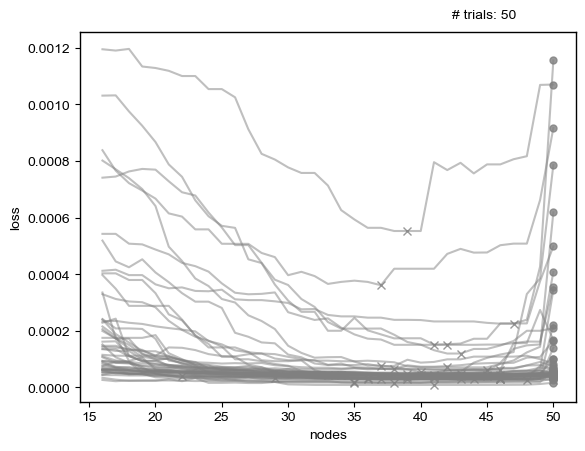

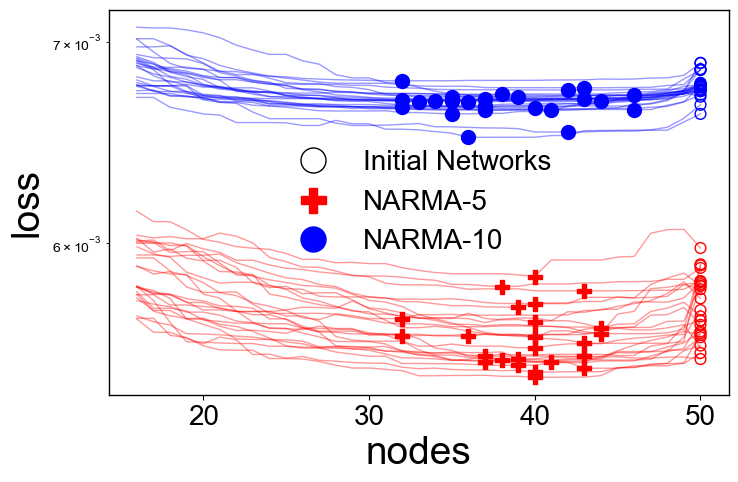

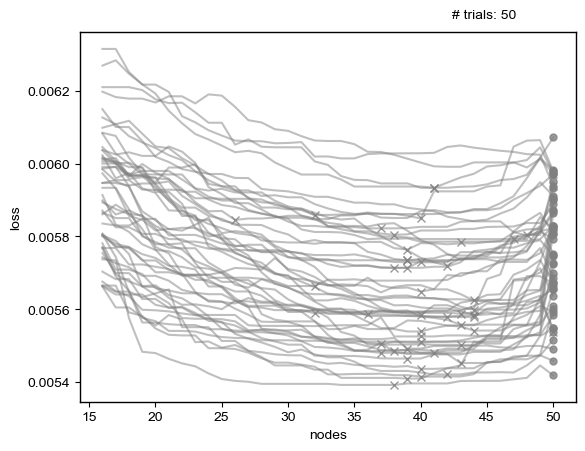

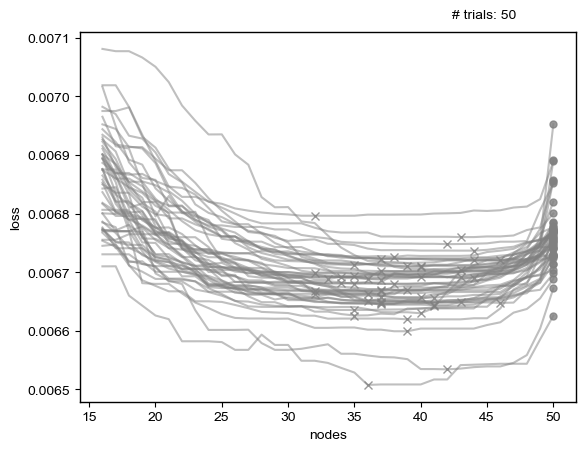

Figure saved as 'pruning_loss_all_NARMA-15.svg'


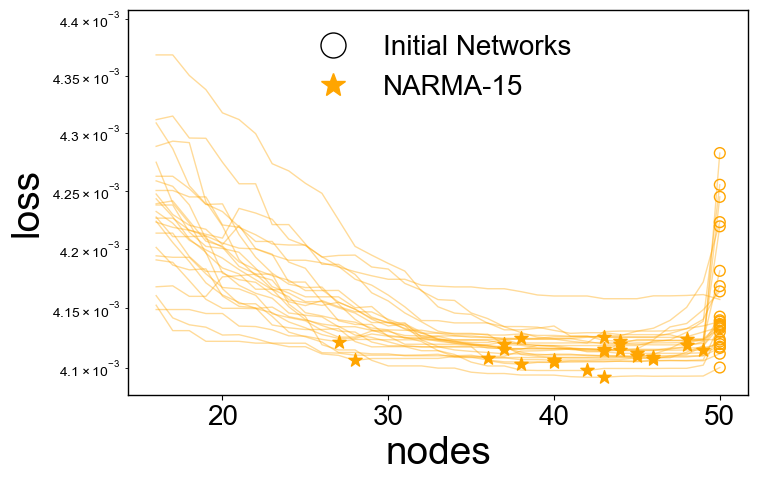

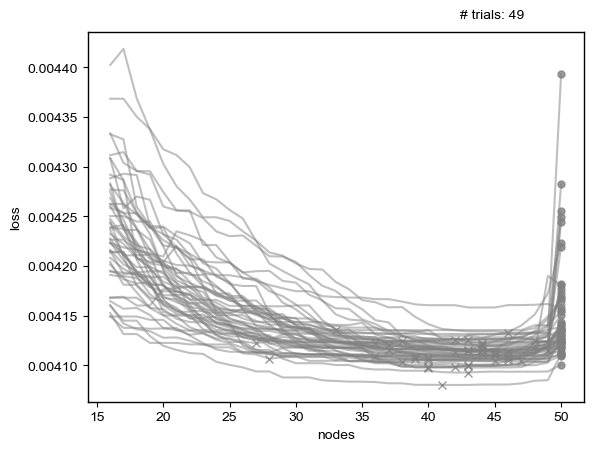

In [ ]:
plot_pruning_loss_histories_all(case_group=["SC1A1", "SC3A1"],
    X_quantity="nodes", title="Sincos12", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["N5A1", "N10A1"],
    X_quantity="nodes", title="NARMA-510", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

plot_pruning_loss_histories_all(case_group=["N15A1"],
    X_quantity="nodes", title="NARMA-15", 
    case_colors=case_colors, final_markers=final_markers, legend_names=legend_names, marker_size=100, save_fig=False)

In [104]:
# List of cases
case_group = ["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2", "SC3A1", "SC3A2", "SC3B1", "SC3B2", 
              "SC3C1", "SC3C2", "N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2", "N10A1", "N10A2", 
              "N10B1", "N10B2", "N10C1", "N10C2", "N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"]

# Initialize an empty list to collect the results for each case
all_percentage_changes = []

# Loop through each case in case_group
for case in case_group:
    # Load data for each case
    data = load_data(case)
    
    # Get initial and pruned graph properties
    graph_props = data["graph_props"]
    graph_props_pruned = data["graph_props_pruned"]
    
    # Initialize a dictionary to store percentage changes for each property
    case_percentage_changes = {'case': case}

    # Loop through each graph property and calculate percentage change
    for i in range(len(graph_props)):
        # Calculate percentage change for each property
        density_change = ((graph_props_pruned[i]['density'] - graph_props[i]['density']) / graph_props[i]['density']) * 100
        spectral_radius_change = ((graph_props_pruned[i]['spectral_radius'] - graph_props[i]['spectral_radius']) / graph_props[i]['spectral_radius']) * 100
        av_in_degree_change = ((graph_props_pruned[i]['av_in_degree'] - graph_props[i]['av_in_degree']) / graph_props[i]['av_in_degree']) * 100
        av_out_degree_change = ((graph_props_pruned[i]['av_out_degree'] - graph_props[i]['av_out_degree']) / graph_props[i]['av_out_degree']) * 100
        clustering_coefficient_change = ((graph_props_pruned[i]['clustering_coefficient'] - graph_props[i]['clustering_coefficient']) / graph_props[i]['clustering_coefficient']) * 100
        
        # Add the percentage changes to the dictionary
        case_percentage_changes['density'] = density_change
        case_percentage_changes['spectral_radius'] = spectral_radius_change
        case_percentage_changes['av_in_degree'] = av_in_degree_change
        case_percentage_changes['av_out_degree'] = av_out_degree_change
        case_percentage_changes['clustering_coefficient'] = clustering_coefficient_change

    # Append the case's percentage changes to the results list
    all_percentage_changes.append(case_percentage_changes)

# Convert the list of results into a DataFrame
df_percentage_changes = pd.DataFrame(all_percentage_changes)

df_percentage_changes

,case,density,spectral_radius,av_in_degree,av_out_degree,clustering_coefficient
0,SC1A1,4.225752,-10.362914,-8.536585,-8.536585,-2.409590
1,SC1A2,0.729777,-4.180960,-5.437352,-5.437352,3.030669
2,SC1B1,0.604933,-1.795274,-2.114119,-2.114119,-10.667545
3,SC1B2,0.112831,-7.841229,-6.651550,-6.651550,0.619501
4,SC1C1,2.770619,-0.660436,-0.343643,-0.343643,0.837073
5,SC1C2,1.201219,-5.713143,-5.954422,-5.954422,3.896817
6,SC3A1,9.530262,-4.215095,-8.352230,-8.352230,50.381770
7,SC3A2,-0.229775,-11.982644,-10.410410,-10.410410,-4.903494
8,SC3B1,3.665865,-11.284095,-10.343035,-10.343035,-5.583323
9,SC3B2,2.181718,-2.170056,-1.960784,-1.960784,-0.996014


In [97]:
def plot_pruning_histories(case_group, X_quantity, Y_quantity, title, final_marker, color, marker_size=80, save_fig=False):
    """Plots pruning histories for a given NARMA case group with improved font sizes and larger axis ticks."""
    
    fig, ax = plt.subplots(figsize=(8, 8))
    
    for CASE in case_group:
        data = load_data(CASE)
        fig_case = plot_property_histories_till_best(data["pruning_histories"], x_quantity=X_quantity, y_quantity=Y_quantity)
        case_ax = fig_case.axes[0]  # Extract the axis from the returned figure

        for line in case_ax.get_lines():
            x_data = line.get_xdata()[::1]  # Every alternate data point
            y_data = line.get_ydata()[::1]

            if len(x_data) < 2:
                continue  # Skip cases where we don't have enough points

            # First and last unique points
            first_x, first_y = x_data[0], y_data[0]
            last_x, last_y = x_data[-1], y_data[-1]

            # 1️⃣ Plot **faded lines** without markers
            ax.plot(x_data, y_data, linestyle=line.get_linestyle(), color=color, alpha=0.3, linewidth=1, zorder=1)

            # 2️⃣ Plot **initial marker** (○) ONLY IF IT'S NOT OVERLAPPING FINAL
            if first_x != last_x or first_y != last_y:
                ax.scatter(first_x, first_y, marker="o", facecolors="none", edgecolors='k', s=marker_size * 0.6, alpha=1.0, zorder=3)

            # 3️⃣ Plot **final marker** (`+`, `●`, `★`)
            ax.scatter(last_x, last_y, marker=final_marker, color=color, s=marker_size, alpha=1.0, zorder=4)

        plt.close(fig_case)  

    # **Custom legend (ONLY Initial and Final Net)**
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color="black", markerfacecolor="none", linestyle="None", markersize=18, label="Initial Networks"),
        plt.Line2D([0], [0], marker=final_marker, color=color, linestyle="None", markersize=18, label=f"{title}"),
    ]

    ax.set_xlabel(X_quantity, fontsize=32)
    ax.set_ylabel(Y_quantity, fontsize=32)    
    ax.tick_params(axis="both", which="major", labelsize=24) 
    ax.legend(handles=legend_elements, loc="best", fontsize=22)

    # **Save Figure Option**
    if save_fig:
        os.makedirs(FIGURE_PATH, exist_ok=True)  # Ensure directory exists
        fig.savefig(os.path.join(FIGURE_PATH, f"{title}_pruning_{Y_quantity}.svg"), dpi=300, bbox_inches="tight")
        print(f"Figure saved as '{title}_pruning_{Y_quantity}.svg'")

    plt.show()


Figure saved as 'Sincos-1_pruning_density.svg'


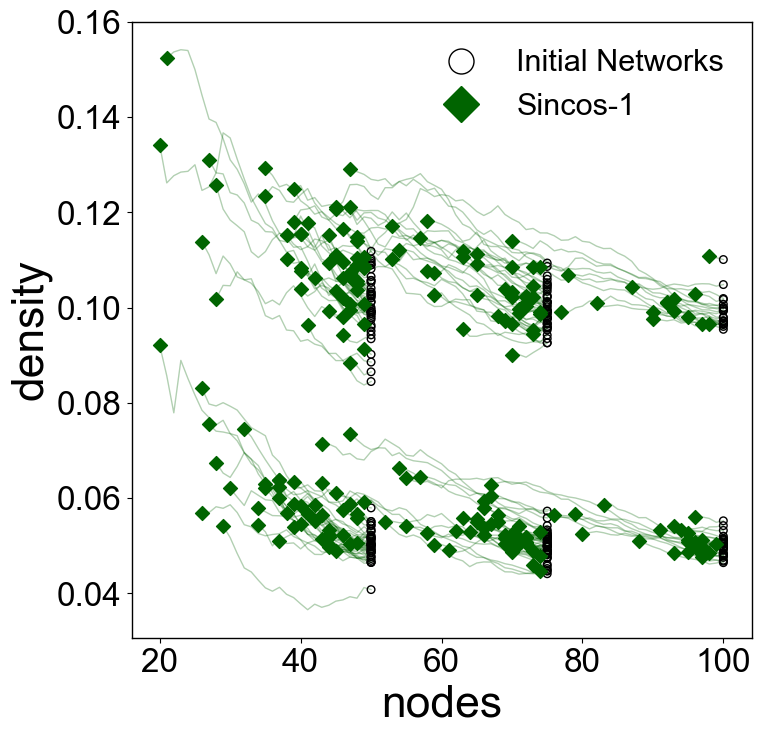

Figure saved as 'Sincos-2_pruning_density.svg'


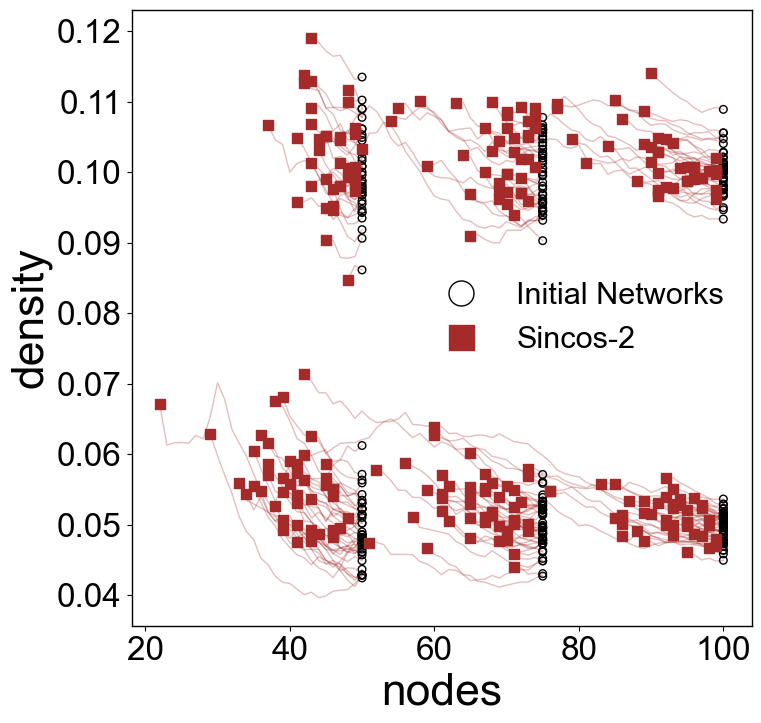

Figure saved as 'NARMA5_pruning_density.svg'


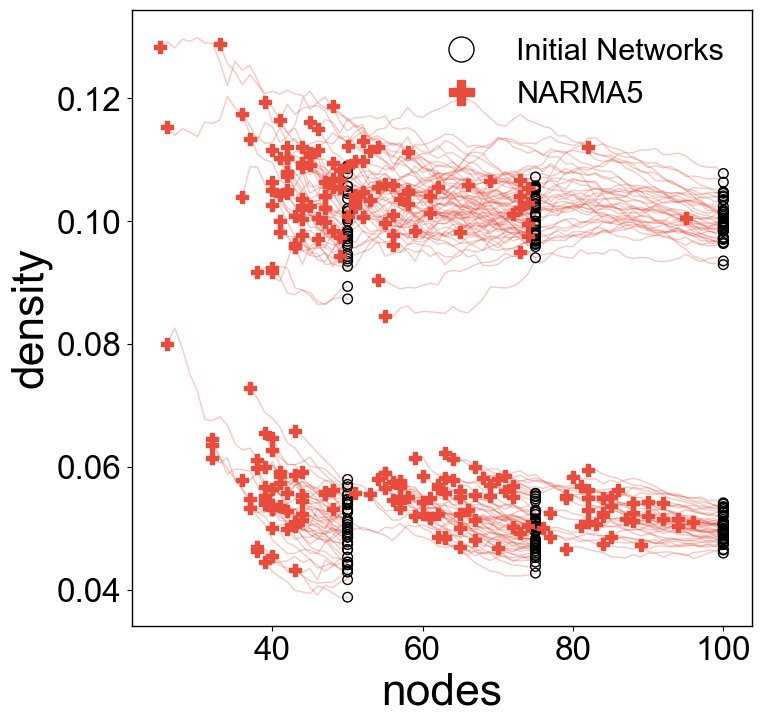

Figure saved as 'NARMA10_pruning_density.svg'


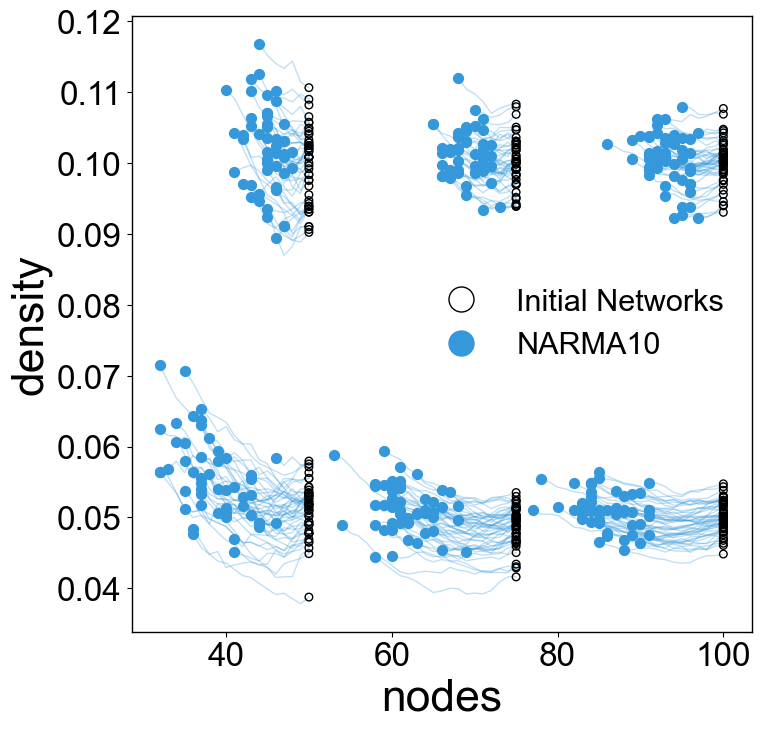

Figure saved as 'NARMA15_pruning_density.svg'


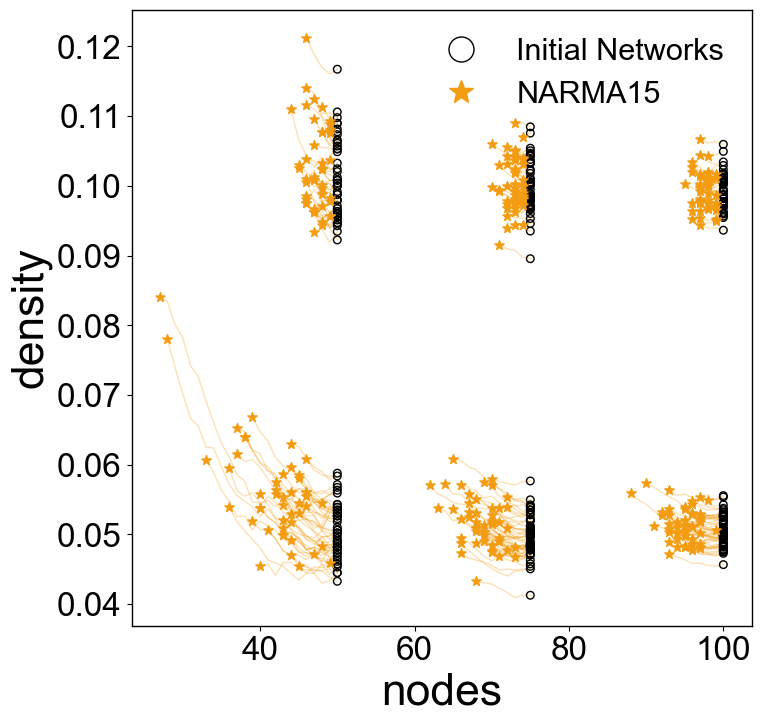

In [99]:
####Sincos###########
plot_pruning_histories(
    case_group=["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2"],
    X_quantity="nodes", Y_quantity="density", title="Sincos-1", final_marker="D", color="#006400", marker_size=50, save_fig=True)

####Sincos###########
plot_pruning_histories(
    case_group=["SC3A1", "SC3A2", "SC3B1", "SC3B2", "SC3C1", "SC3C2"],
    X_quantity="nodes", Y_quantity="density", title="Sincos-2", final_marker="s", color="#A52A2A", marker_size=50, save_fig=True)

####NARM<5,10,15>####
plot_pruning_histories(
    case_group=["N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2"],
    X_quantity="nodes", Y_quantity="density", title="NARMA5", final_marker="P", color="#e74c3c", marker_size=80, save_fig=True)

plot_pruning_histories(
    case_group=["N10A1", "N10A2", "N10B1", "N10B2", "N10C1", "N10C2"],
    X_quantity="nodes", Y_quantity="density", title="NARMA10", final_marker="o", color="#3498db", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"],
    X_quantity="nodes", Y_quantity="density", title="NARMA15", final_marker="*", color="#f39c12", marker_size=50, save_fig=True)

Figure saved as 'Sincos-1_pruning_clustering_coefficient.svg'


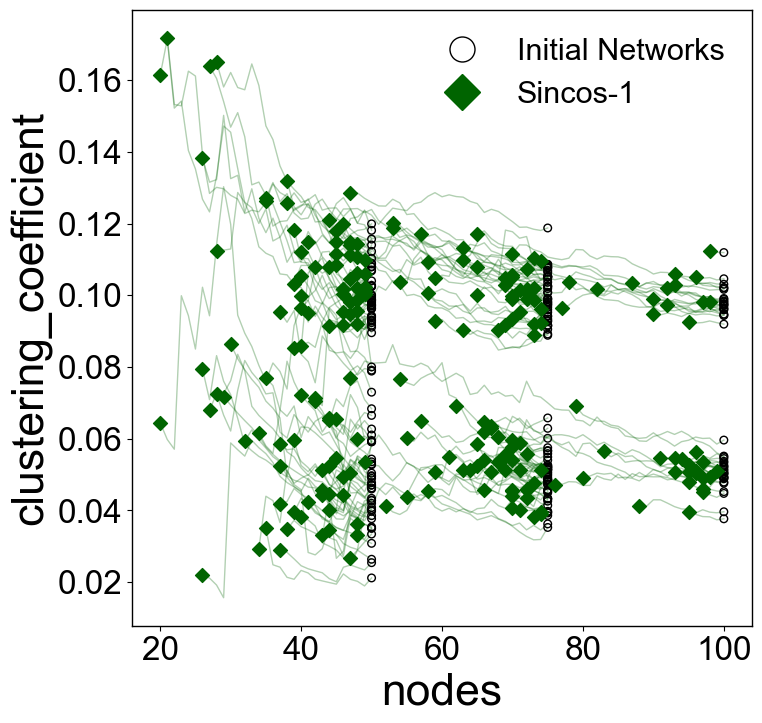

Figure saved as 'Sincos-2_pruning_clustering_coefficient.svg'


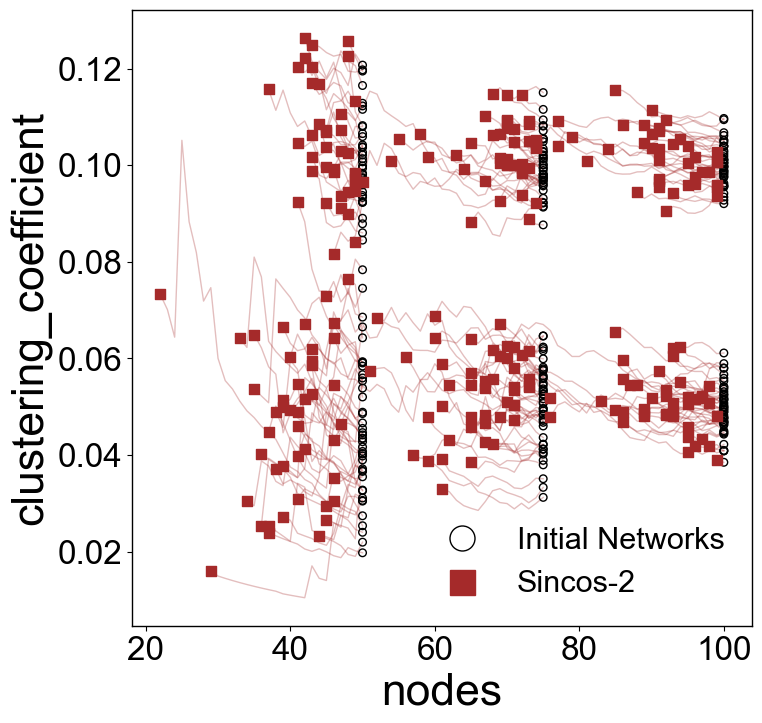

Figure saved as 'NARMA5_pruning_clustering_coefficient.svg'


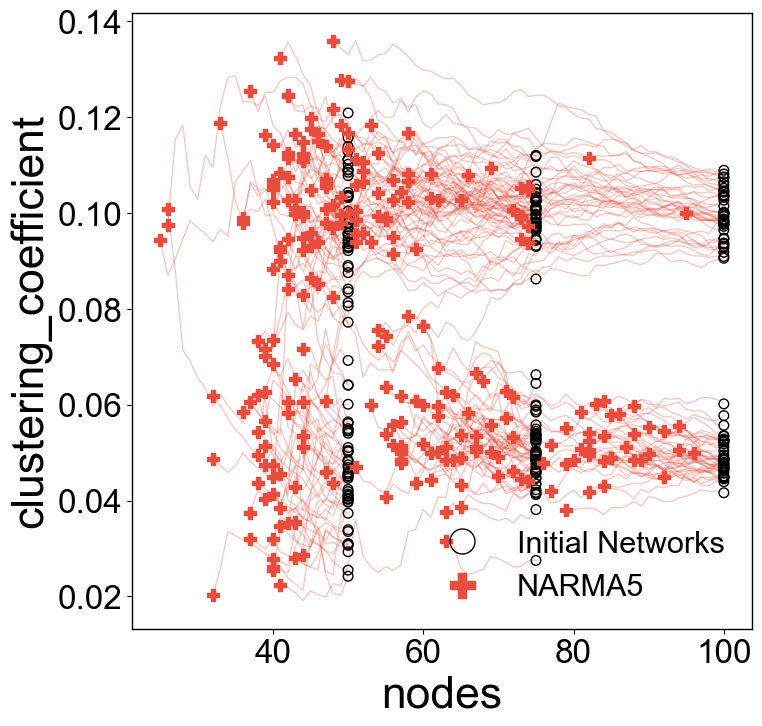

Figure saved as 'NARMA10_pruning_clustering_coefficient.svg'


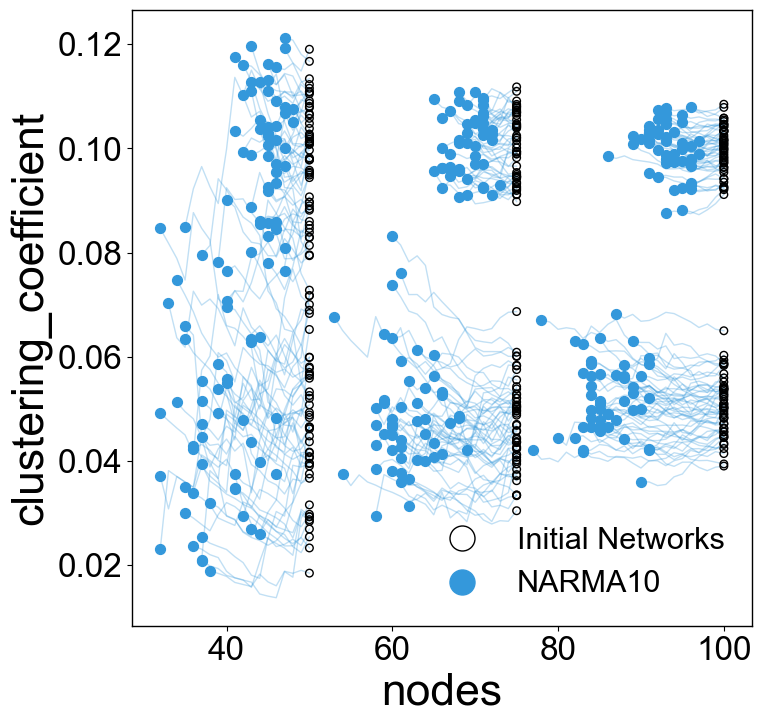

Figure saved as 'NARMA15_pruning_clustering_coefficient.svg'


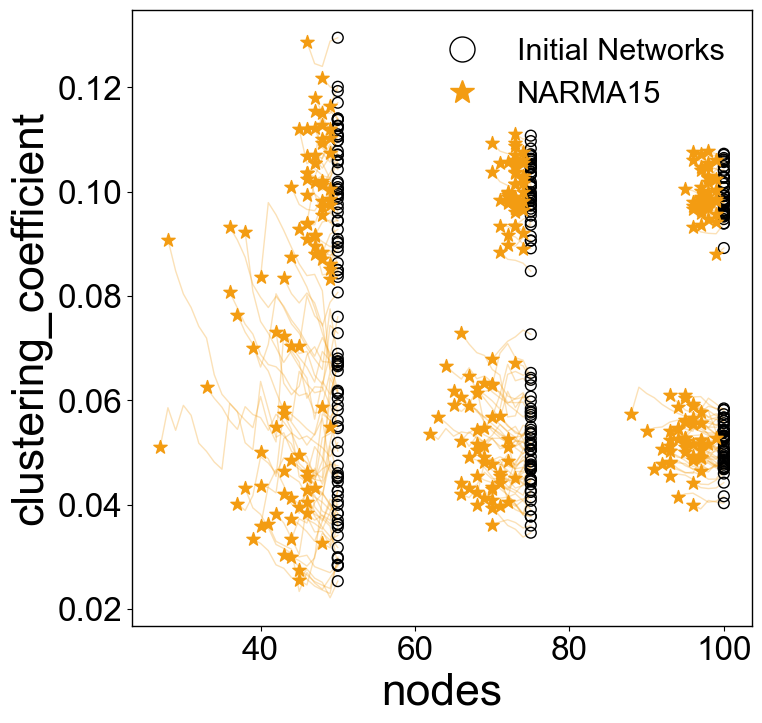

In [100]:
####Sincos###########
plot_pruning_histories(
    case_group=["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2"],
    X_quantity="nodes", Y_quantity="clustering_coefficient", title="Sincos-1", final_marker="D", color="#006400", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["SC3A1", "SC3A2", "SC3B1", "SC3B2", "SC3C1", "SC3C2"],
    X_quantity="nodes", Y_quantity="clustering_coefficient", title="Sincos-2", final_marker="s", color="#A52A2A", marker_size=50, save_fig=True)


####NARM<5,10,15>####
plot_pruning_histories(
    case_group=["N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2"],
    X_quantity="nodes", Y_quantity="clustering_coefficient", title="NARMA5", final_marker="P", color="#e74c3c", marker_size=80, save_fig=True)

plot_pruning_histories(
    case_group=["N10A1", "N10A2", "N10B1", "N10B2", "N10C1", "N10C2"],
    X_quantity="nodes", Y_quantity="clustering_coefficient", title="NARMA10", final_marker="o", color="#3498db", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"],
    X_quantity="nodes", Y_quantity="clustering_coefficient", title="NARMA15", final_marker="*", color="#f39c12", marker_size=100, save_fig=True)

Figure saved as 'Sincos-1_pruning_av_out_degree.svg'


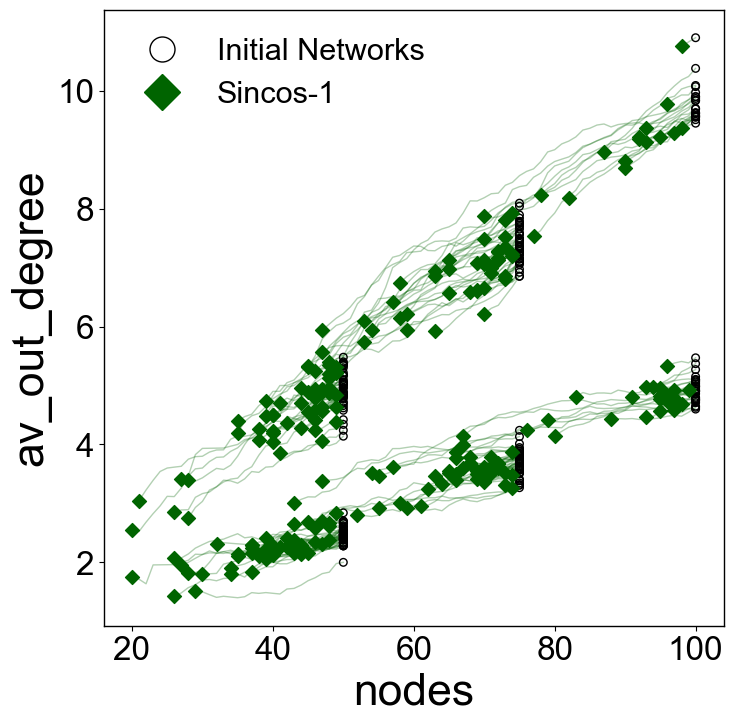

Figure saved as 'Sincos-2_pruning_av_out_degree.svg'


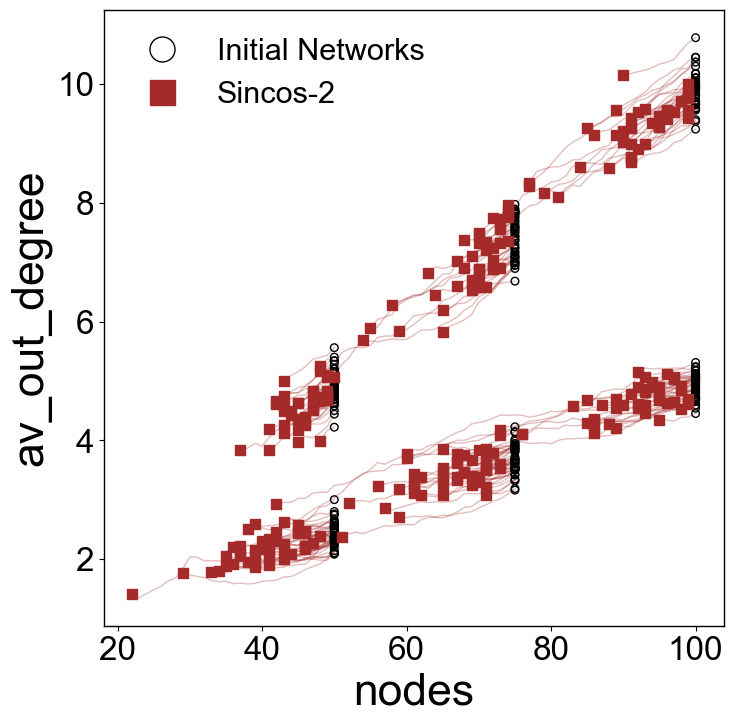

Figure saved as 'NARMA5_pruning_av_out_degree.svg'


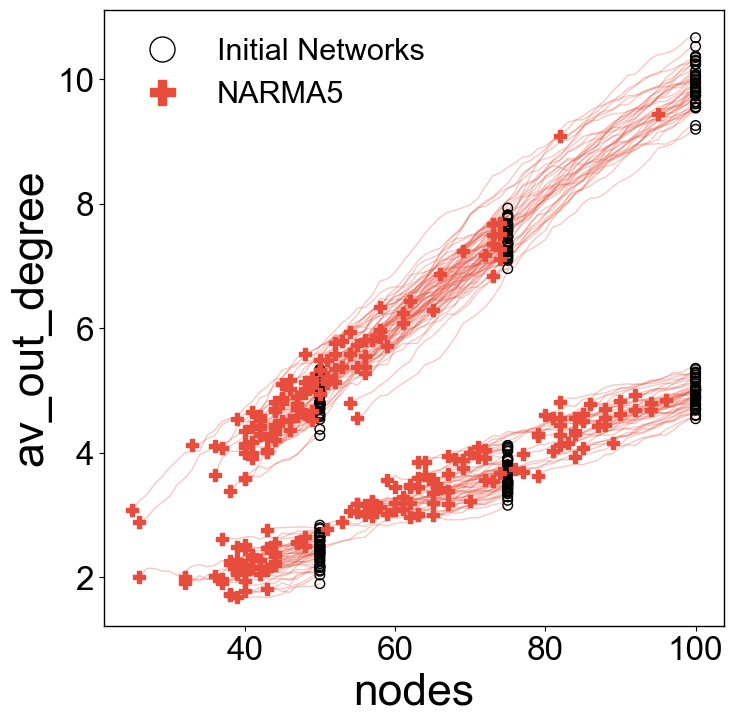

Figure saved as 'NARMA10_pruning_av_out_degree.svg'


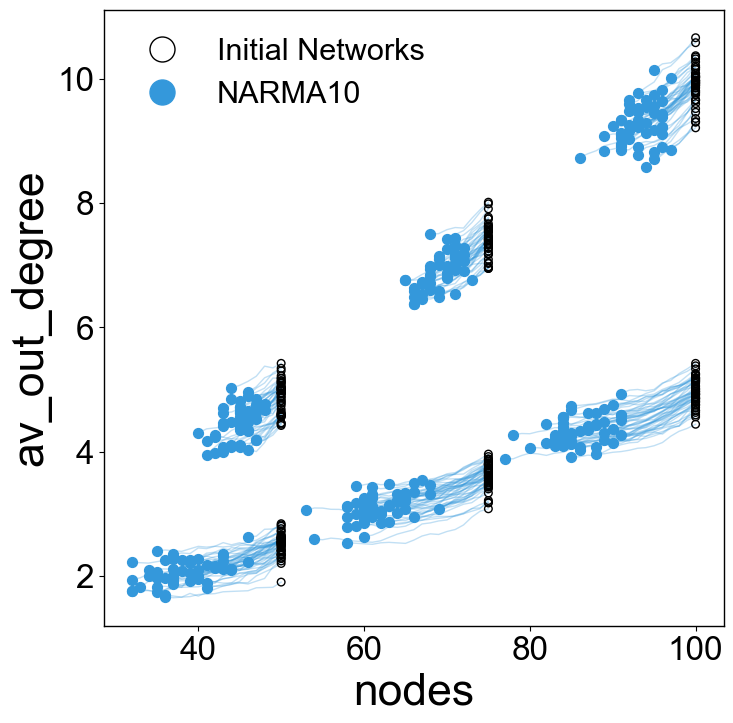

Figure saved as 'NARMA15_pruning_av_out_degree.svg'


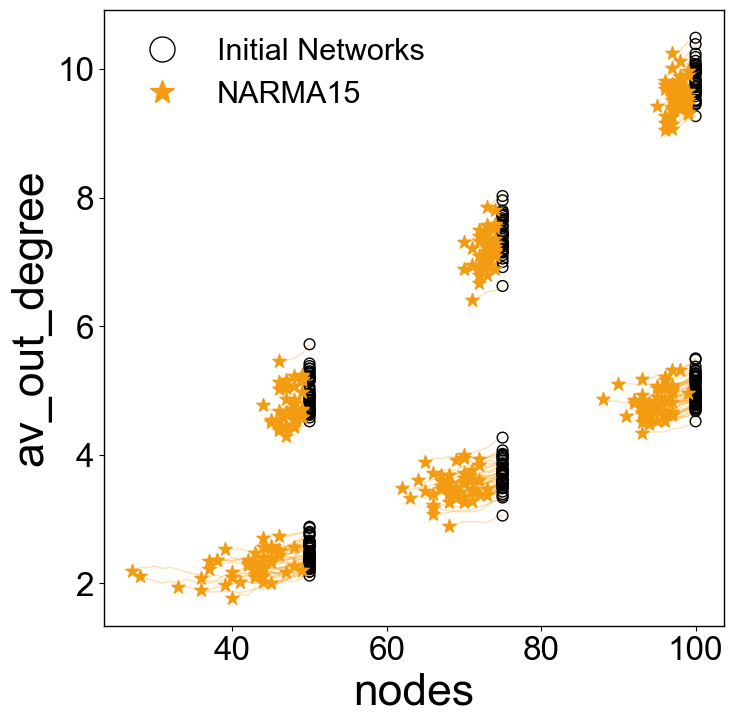

In [101]:
####Sincos###########
plot_pruning_histories(
    case_group=["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2"],
    X_quantity="nodes", Y_quantity="av_out_degree", title="Sincos-1", final_marker="D", color="#006400", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["SC3A1", "SC3A2", "SC3B1", "SC3B2", "SC3C1", "SC3C2"],
    X_quantity="nodes", Y_quantity="av_out_degree", title="Sincos-2", final_marker="s", color="#A52A2A", marker_size=50, save_fig=True)

####NARM<5,10,15>####
plot_pruning_histories(
    case_group=["N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2"],
    X_quantity="nodes", Y_quantity="av_out_degree", title="NARMA5", final_marker="P", color="#e74c3c", marker_size=80, save_fig=True)

plot_pruning_histories(
    case_group=["N10A1", "N10A2", "N10B1", "N10B2", "N10C1", "N10C2"],
    X_quantity="nodes", Y_quantity="av_out_degree", title="NARMA10", final_marker="o", color="#3498db", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"],
    X_quantity="nodes", Y_quantity="av_out_degree", title="NARMA15", final_marker="*", color="#f39c12", marker_size=100, save_fig=True)

Figure saved as 'Sincos-1_pruning_spectral_radius.svg'


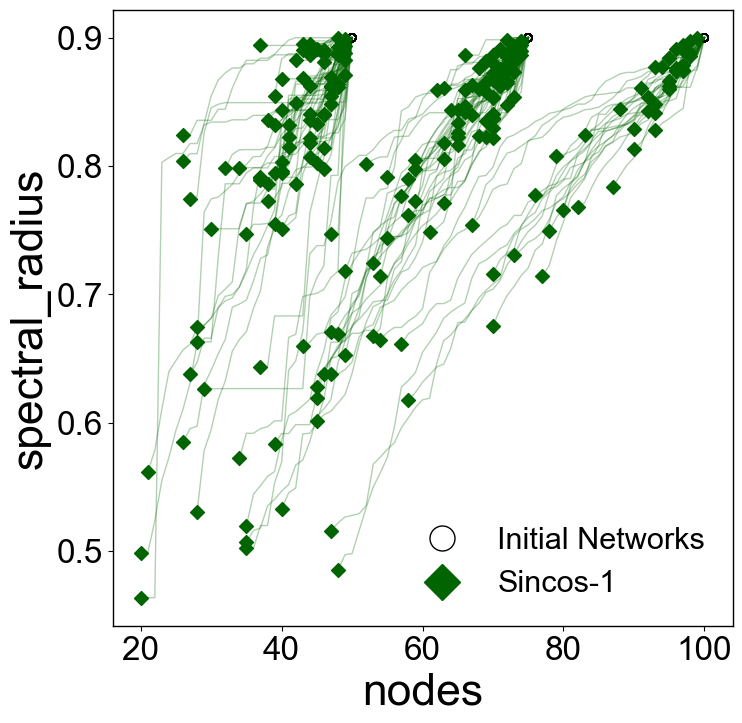

Figure saved as 'Sincos-2_pruning_spectral_radius.svg'


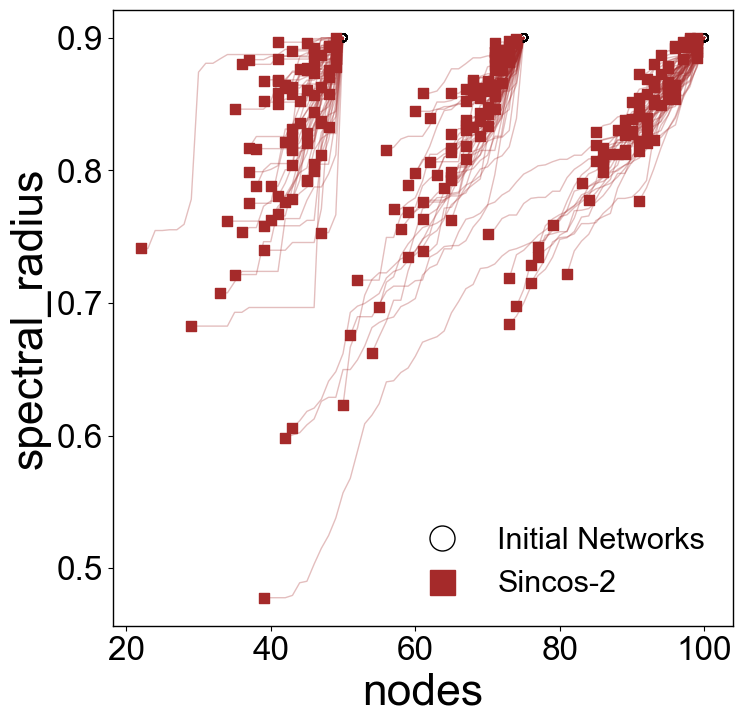

Figure saved as 'NARMA5_pruning_spectral_radius.svg'


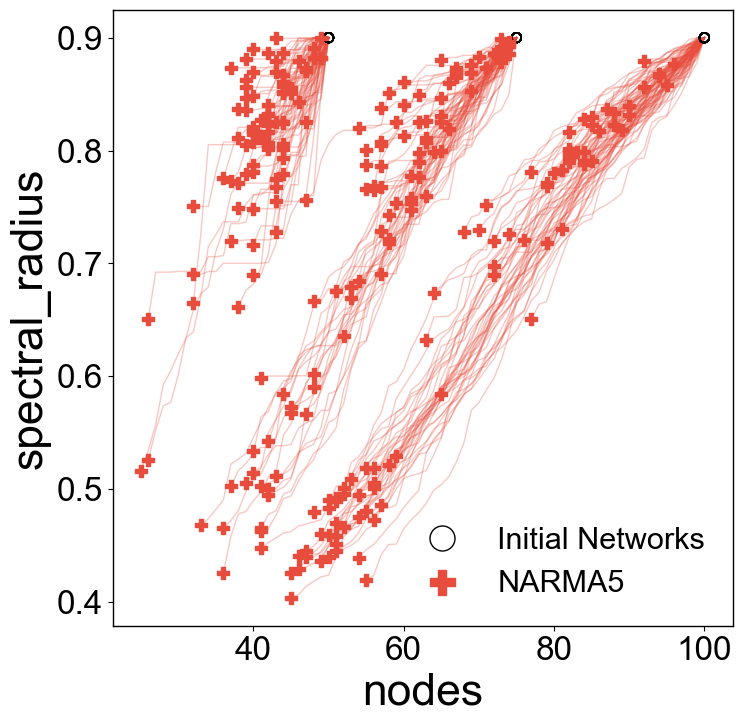

Figure saved as 'NARMA10_pruning_spectral_radius.svg'


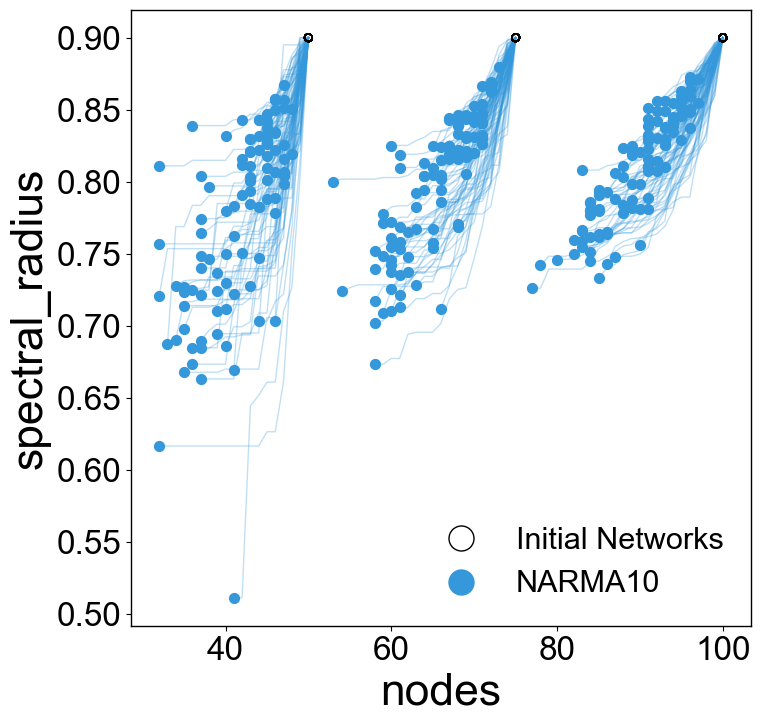

Figure saved as 'NARMA15_pruning_spectral_radius.svg'


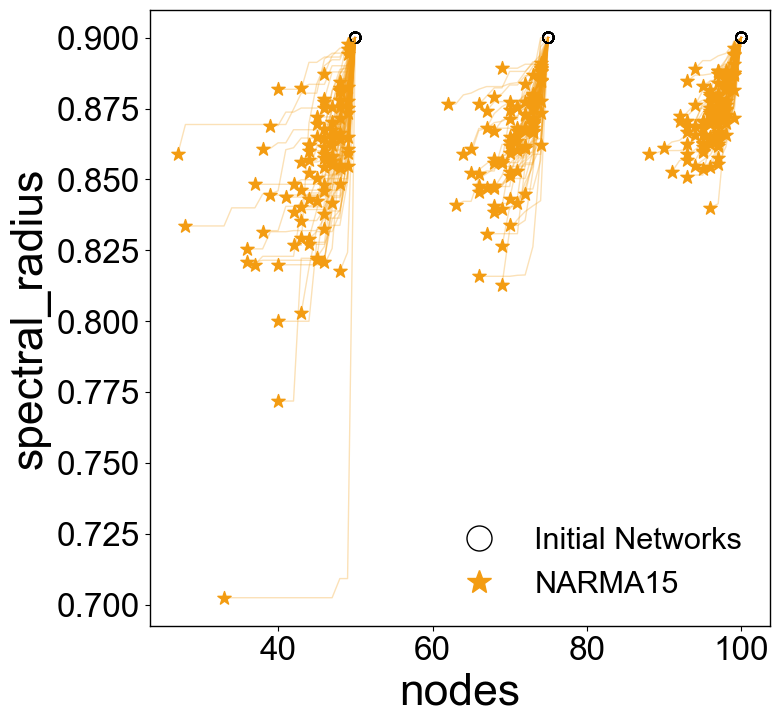

In [103]:
####Sincos###########
plot_pruning_histories(
    case_group=["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2"],
    X_quantity="nodes", Y_quantity="spectral_radius", title="Sincos-1", final_marker="D", color="#006400", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["SC3A1", "SC3A2", "SC3B1", "SC3B2", "SC3C1", "SC3C2"],
    X_quantity="nodes", Y_quantity="spectral_radius", title="Sincos-2", final_marker="s", color="#A52A2A", marker_size=50, save_fig=True)

####NARM<5,10,15>####
plot_pruning_histories(
    case_group=["N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2"],
    X_quantity="nodes", Y_quantity="spectral_radius", title="NARMA5", final_marker="P", color="#e74c3c", marker_size=80, save_fig=True)

plot_pruning_histories(
    case_group=["N10A1", "N10A2", "N10B1", "N10B2", "N10C1", "N10C2"],
    X_quantity="nodes", Y_quantity="spectral_radius", title="NARMA10", final_marker="o", color="#3498db", marker_size=50, save_fig=True)

plot_pruning_histories(
    case_group=["N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"],
    X_quantity="nodes", Y_quantity="spectral_radius", title="NARMA15", final_marker="*", color="#f39c12", marker_size=100, save_fig=True)

In [41]:
# Function to plot a single property or score comparison
def plot_comparison(data, x_pos, ylabel, xnames, title, save_fig=False):
    fig=plt.figure(figsize=(10, 8))
    
    # Strip plot for individual data points
    sns.stripplot(y="Value", x="x_pos", hue="Type", data=data, jitter=0.2, dodge=True,
                  palette={"Initial Networks": "lightgray", "Pruned": "darkgray"}, size=4, 
                  linewidth=0.75, edgecolor="gray", alpha=1, legend=None)
    
    # Violin plot to show distribution
    sns.violinplot(y="Value", x="x_pos", hue="Type", data=data, scale="width", inner="quartiles",
                   palette={"Initial Networks": "lightgray", "Pruned": "darkgray"}, 
                   size=4, linewidth=1, edgecolor="gray", alpha=0.6, dodge=True, cut=0)

    # Customize axis labels and tick parameters
    plt.tick_params(axis='both', labelsize=20)
    plt.ylabel(ylabel, fontsize=28)
    plt.xlabel('Tasks', fontsize=28)

    # Set the custom x-ticks based on x_pos and the provided Xnames
    plt.xticks(ticks=np.arange(len(xnames)), labels=xnames, ha="center")

    # Set the legend color manually to match the colors of the violin plot
    handles, labels = plt.gca().get_legend_handles_labels()
    plt.legend(handles, labels, loc='best', fontsize=20)

    # Access the axis and modify the violin plot properties
    ax = fig.gca()
    # Increase the outline thickness of the violins
    for violin in ax.collections:
        violin.set_linewidth(1.25)  # Set the desired thickness (e.g., 2)
        violin.set_edgecolor("black")
    # Increase the thickness of mean and SD lines
    for line in ax.lines:
        line.set_linewidth(1.5) 
        line.set_color("black")
    
    if save_fig:
        os.makedirs(FIGURE_PATH, exist_ok=True)  # Ensure directory exists
        plt.savefig(os.path.join(FIGURE_PATH, f"{title}_pruning_{ylabel}.svg"), dpi=300, bbox_inches="tight")
        print(f"Figure saved as '{title}_pruning_{ylabel}.svg'")

    plt.show()

# Function to create DataFrame from pruning histories or scores
def create_dataframe(properties, case_group, scores_key=None, scores_pruned_key=None):
    df_list = []
    
    for case in case_group:
        pruning_histories = data_dict[case]["pruning_histories"]
        for history in pruning_histories:
            for prop in properties:
                best_idx = np.argmin(history["loss"])
                classic_value = history["graph_props"][prop][0]
                pruned_value = history["graph_props"][prop][best_idx]

                # Convert spectral_radius values to float
                if prop == "spectral_radius":
                    classic_value = float(classic_value)
                    pruned_value = float(pruned_value)

                df_list.append((case, "Initial Networks", classic_value))
                df_list.append((case, "Pruned", pruned_value))

    return pd.DataFrame(df_list, columns=["Case", "Type", "Value"])

# Function to create DataFrame for node comparison
def create_node_dataframe(case_group):
    df_list = []
    
    # Loop over the cases and repetitions to extract node data
    for case in case_group:
        for i in range(len(data_dict[case]["models"])):
            nodes_classic = data_dict[case]["models"][i].reservoir_layer.nodes
            nodes_pruned = data_dict[case]["models_pruned"][i].reservoir_layer.nodes
            
            # Flatten the node values and append to the DataFrame list
            df_list.append((case, "Initial Networks", nodes_classic))
            df_list.append((case, "Pruned", nodes_pruned))

    return pd.DataFrame(df_list, columns=["Case", "Type", "Value"])


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


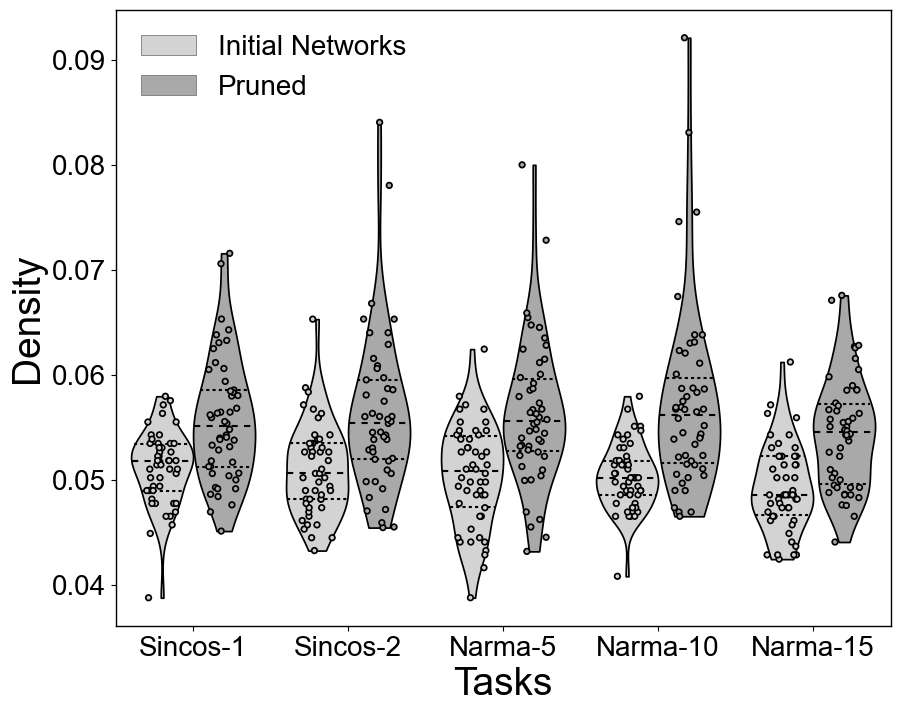

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


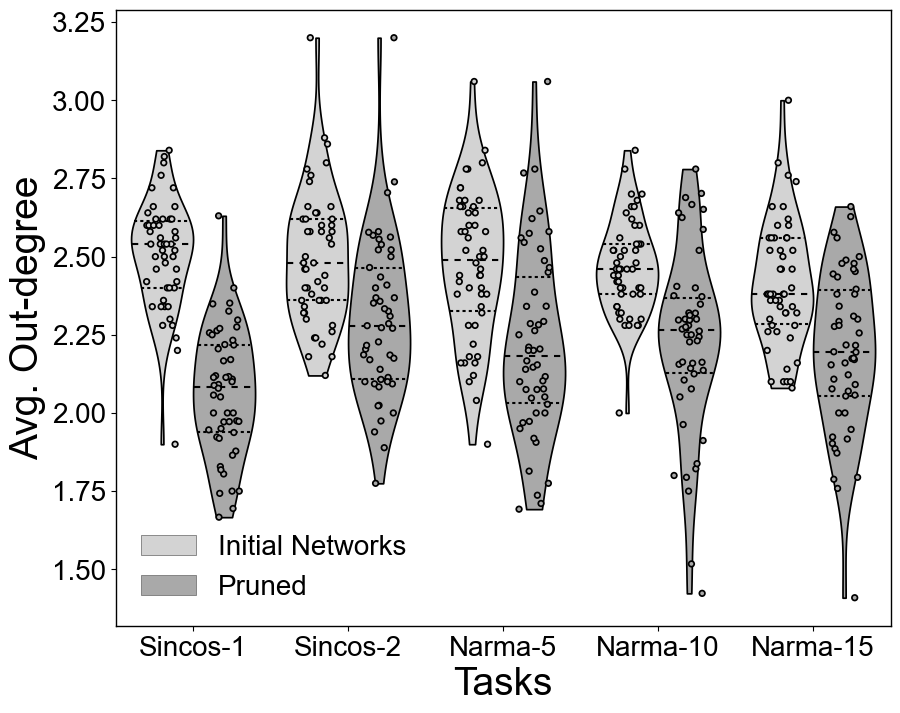

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


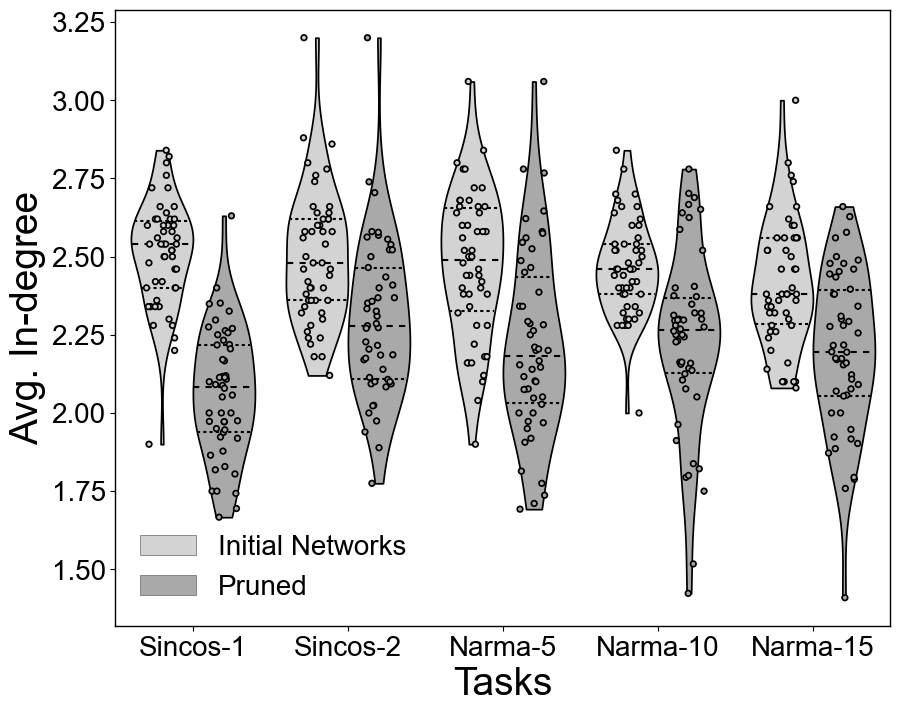

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


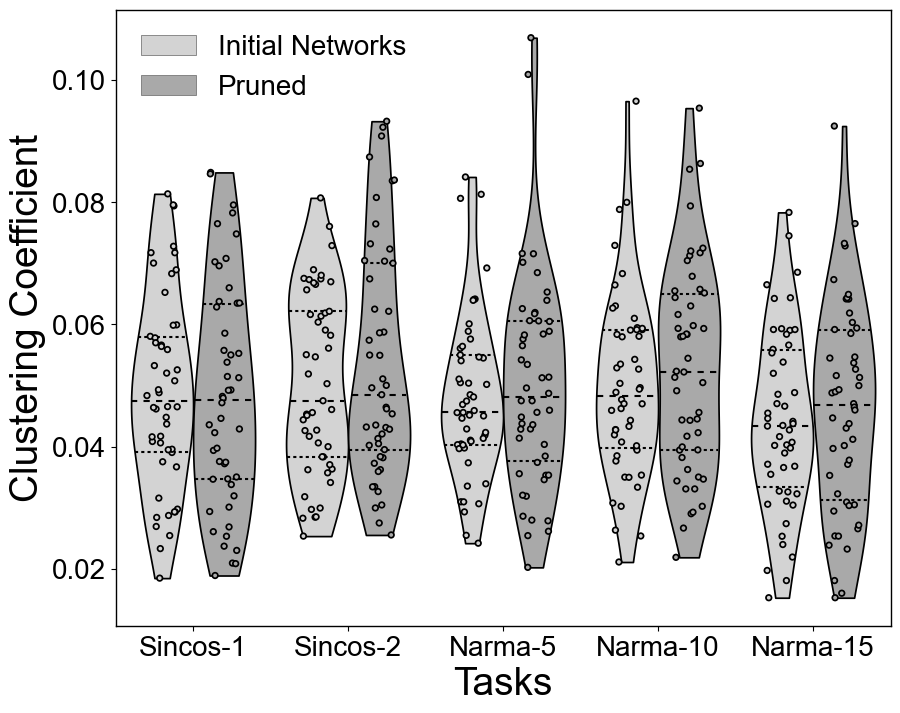

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


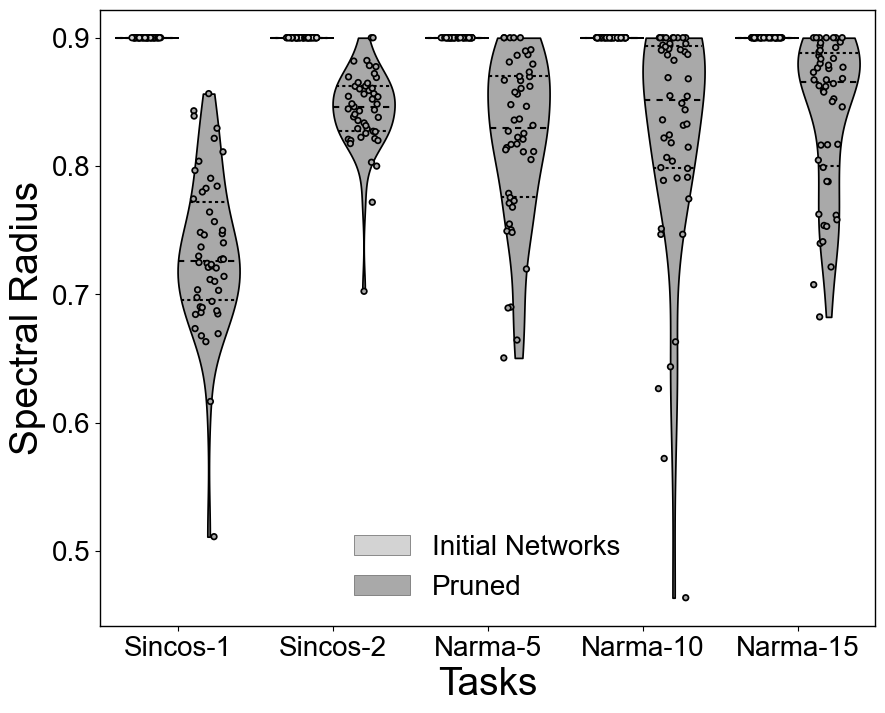

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


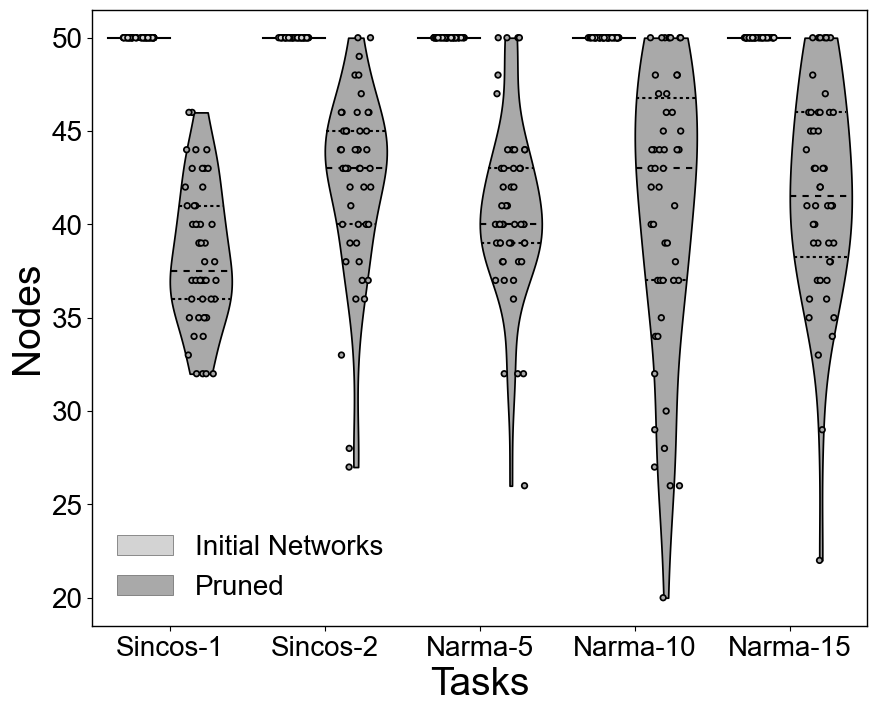

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


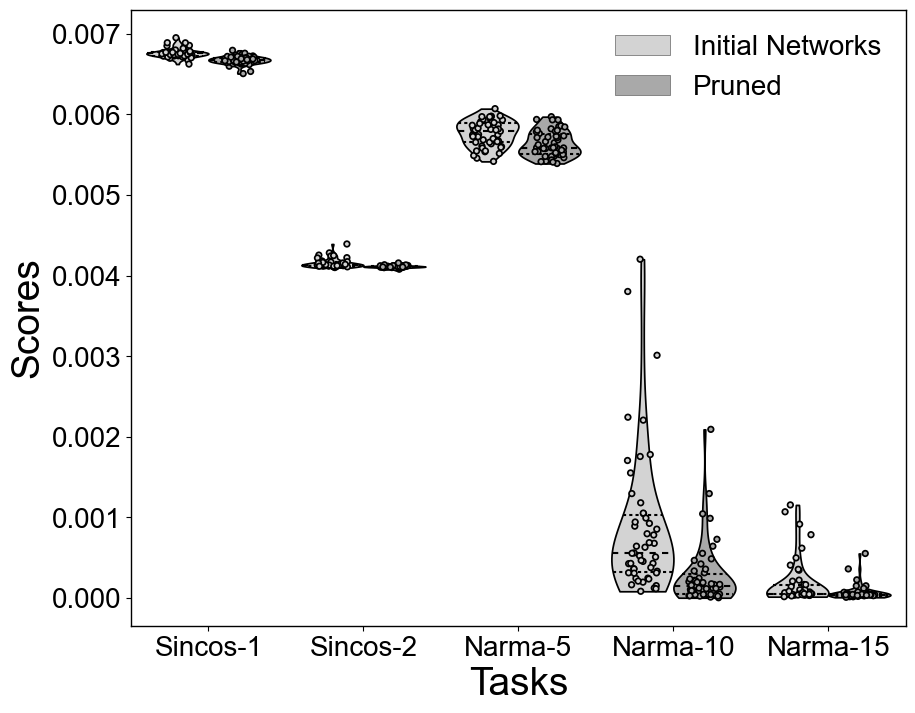

In [42]:
# Define case group and Xnames
case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]

# Define properties and scores to compare
properties = ["density", "av_out_degree", "av_in_degree", "clustering_coefficient", "spectral_radius"]

Ylabels = ["Density", "Avg. Out-degree", "Avg. In-degree", "Clustering Coefficient", "Spectral Radius"]
scores_key = "scores"
scores_pruned_key = "scores_pruned"

# Dictionary to hold results for each case (Make sure `load_data` is defined and returns the expected structure)
data_dict = {case: load_data(case) for case in case_group}

# Plot for each property
j=0
for prop in properties:
    df = create_dataframe([prop], case_group)
    # Apply case positions
    df["x_pos"] = df["Case"].astype('category').cat.codes
    plot_comparison(df, df["x_pos"], Ylabels[j], Xnames, title='PrunVsRand', save_fig=False)
    j+=1


#################Nodes######################
# Create DataFrame for node data
df_nodes = create_node_dataframe(case_group)
df_nodes["x_pos"] = df_nodes["Case"].astype('category').cat.codes

# Plot node comparison
plot_comparison(df_nodes, df_nodes["x_pos"], "Nodes", Xnames, "PrunVsRand", save_fig=False)

#################Scores######################
# Plot scores comparison for each case
df_list = []
for case in case_group:
    for score in data_dict[case][scores_key]:
        df_list.append((case, "Initial Networks", score))
    for score in data_dict[case][scores_pruned_key]:
        df_list.append((case, "Pruned", score))

df_scores = pd.DataFrame(df_list, columns=["Case", "Type", "Value"])
df_scores["x_pos"] = df_scores["Case"].astype('category').cat.codes
plot_comparison(df_scores, df_scores["x_pos"], "Scores", Xnames, title='PrunVsRand', save_fig=False)


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Figure saved as 'PrunVsRand_pruning_Memory Capacity.svg'


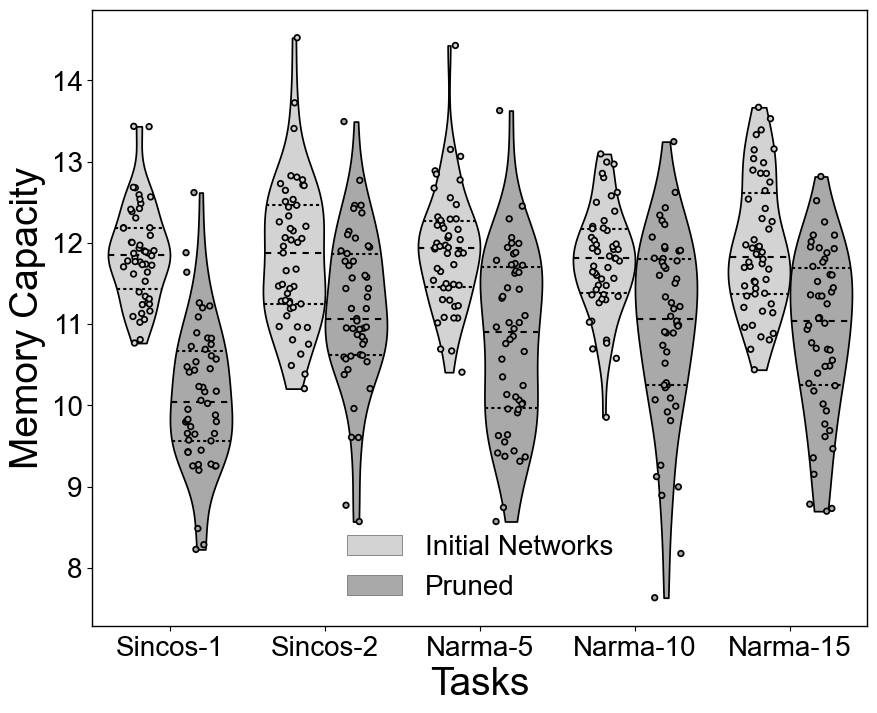

In [ ]:
def load_data_MC(CASE):
    SAVE_NAME = f"{CASE}_MCs.pkl"
    SAVE_PATH = os.path.join(os.getcwd(), "stored_results", SAVE_NAME)

    # load data
    with open(SAVE_PATH, "rb") as file:
        data = pickle.load(file)    
    return data

#################MCs######################
# Plot MC comparison for each case
data_dict = {case: load_data_MC(case) for case in case_group}
df_list = []
for case in case_group:
    for score in data_dict[case][0]:
        df_list.append((case, "Initial Networks", score))
    for score in data_dict[case][1]:
        df_list.append((case, "Pruned", score))

df_mcs = pd.DataFrame(df_list, columns=["Case", "Type", "Value"])
df_mcs["x_pos"] = df_mcs["Case"].astype('category').cat.codes
plot_comparison(df_mcs, df_mcs["x_pos"], "Memory Capacity", Xnames, title='PrunVsRand', save_fig=True)

In [58]:
# getting the difference between the two sets of scores
def relative_change(initial, pruned):
    return (np.mean(pruned) - np.mean(initial)) / np.mean(initial)

def get_score_differences(data_dict, case_group):
    
    for case in case_group:
        initial_mcs = data_dict[case][0]
        pruned_mcs = data_dict[case][1]
        # Calculate all measures
        avg_initial = np.mean(initial_mcs)
        avg_pruned = np.mean(pruned_mcs)
        abs_change = np.abs(avg_pruned - avg_initial)
        rel_change = relative_change(initial_mcs, pruned_mcs)
        print(f"Case: {case}, Avg. Initial: {avg_initial:.4f}, Avg. Pruned: {avg_pruned:.4f}, "
              f"Absolute Change: {abs_change:.4f}, Relative Change: {rel_change*100:.4f}%")
    
get_score_differences(data_dict, case_group)

Case: SC1A1, Avg. Initial: 11.7834, Avg. Pruned: 10.9555, Absolute Change: 0.8278, Relative Change: -7.0255%
Case: SC3A1, Avg. Initial: 11.9578, Avg. Pruned: 10.8894, Absolute Change: 1.0684, Relative Change: -8.9345%
Case: N5A1, Avg. Initial: 11.9054, Avg. Pruned: 10.8011, Absolute Change: 1.1043, Relative Change: -9.2760%
Case: N10A1, Avg. Initial: 11.8687, Avg. Pruned: 10.1141, Absolute Change: 1.7546, Relative Change: -14.7835%
Case: N15A1, Avg. Initial: 11.8473, Avg. Pruned: 11.1791, Absolute Change: 0.6682, Relative Change: -5.6400%


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


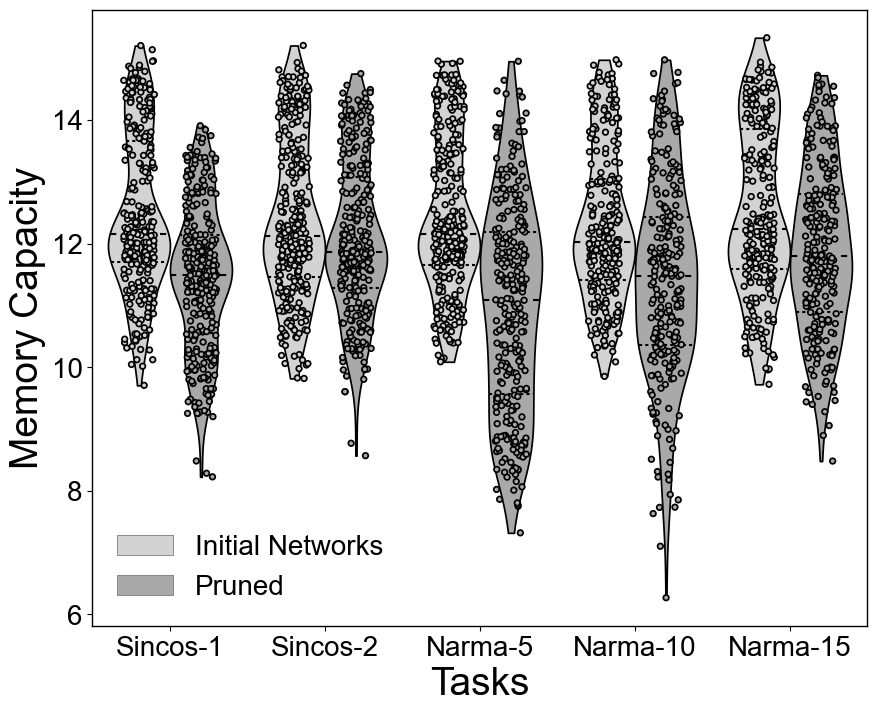

In [37]:
#################MCs######################
case_group = ["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2", "SC3A1", "SC3A2", "SC3B1", "SC3B2", 
              "SC3C1", "SC3C2", "N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2", "N10A1", "N10A2", 
              "N10B1", "N10B2", "N10C1", "N10C2", "N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"]
# Plot MC comparison for each case
data_dict = {case: load_data_MC(case) for case in case_group}
df_list = []
for case in case_group:
    for mc in data_dict[case][0]:
        if case in ["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2"]:
            df_list.append(('SinCos-1', "Initial Networks", mc))
    for mc in data_dict[case][1]:
        if case in ["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2"]:
            df_list.append(('SinCos-1', "Pruned", mc))

    for mc in data_dict[case][0]:
        if case in ["SC3A2", "SC3B1", "SC3B2", "SC3C1", "SC3C2"]:
            df_list.append(('SinCos-3', "Initial Networks", mc))
    for mc in data_dict[case][1]:
        if case in ["SC3A2", "SC3B1", "SC3B2", "SC3C1", "SC3C2"]:
            df_list.append(('SinCos-3', "Pruned", mc))

    for mc in data_dict[case][0]:
        if case in ["N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2"]:
            df_list.append(('Narma-5', "Initial Networks", mc))
    for mc in data_dict[case][1]:
        if case in ["N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2"]:
            df_list.append(('Narma-5', "Pruned", mc))

    for mc in data_dict[case][0]:
        if case in ["N10A1", "N10A2", "N10B1", "N10B2", "N10C1", "N10C2"]:
            df_list.append(('Narma-10', "Initial Networks", mc))
    for mc in data_dict[case][1]:
        if case in ["N10A1", "N10A2", "N10B1", "N10B2", "N10C1", "N10C2"]:
            df_list.append(('Narma-10', "Pruned", mc))

    for mc in data_dict[case][0]:
        if case in ["N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"]:
            df_list.append(('Narma-15', "Initial Networks", mc))
    for mc in data_dict[case][1]:
        if case in ["N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"]:
            df_list.append(('Narma-15', "Pruned", mc))

df_mcs = pd.DataFrame(df_list, columns=["Case", "Type", "Value"])
df_mcs["x_pos"] = df_mcs["Case"].astype('category').cat.codes
plot_comparison(df_mcs, df_mcs["x_pos"], "Memory Capacity", Xnames, title='PrunVsRand', save_fig=False)

In [53]:
# df_list

In [122]:
from scipy.optimize import linear_sum_assignment
import matplotlib.patches as mpatches
import networkx as nx


def NetPlot(Model_rand, Model_prun, title, NodeColr='red', save_fig=False):
    A_G = Model_rand.reservoir_layer.weights #np.random.randint(0, 2, (N, N))  # Big graph
    N = Model_rand.reservoir_layer.nodes #50  # Big graph size

    A_Gs = Model_prun.reservoir_layer.weights #np.random.randint(0, 2, (M, M))  # Small graph
    M = Model_prun.reservoir_layer.nodes #20  # Small graph size

    # Convert adjacency matrices to directed graphs
    G = nx.from_numpy_array(A_G, create_using=nx.DiGraph)
    Gs = nx.from_numpy_array(A_Gs, create_using=nx.DiGraph)

    # --- Step 1: Find Best Node Alignment ---
    big_degrees = np.array([G.degree(n) for n in G.nodes])
    small_degrees = np.array([Gs.degree(n) for n in Gs.nodes])

    # Solve assignment problem (Hungarian algorithm) to best align nodes
    cost_matrix = np.abs(big_degrees[:, None] - small_degrees[None, :])  # Cost based on degree differences
    row_ind, col_ind = linear_sum_assignment(cost_matrix)

    # Create a node mapping: match small network nodes to big network nodes
    node_mapping = {list(Gs.nodes)[j]: list(G.nodes)[i] for i, j in zip(row_ind, col_ind)}
    Gs = nx.relabel_nodes(Gs, node_mapping)  # Update Gs labels to fit into G

    # Identify node sets
    big_nodes = set(G.nodes)
    small_nodes = set(Gs.nodes)
    remaining_big_nodes = big_nodes - small_nodes  # Nodes in G that are NOT in Gs

    # --- Step 2: Use the same layout ---
    pos = nx.spring_layout(G, seed=42)  # Consistent layout for both

    # --- Step 3: Plot Correctly ---
    plt.figure(figsize=(10, 10))

    # Draw small graph (ONLY edges between red nodes)
    nx.draw_networkx_nodes(Gs, pos, node_color=NodeColr, node_size=200, alpha=0.65, label=f'Final Pruned Network ($N={M}$)')
    nx.draw_networkx_edges(Gs, pos, edge_color=NodeColr, alpha=0.4, arrows=True, arrowsize=12, width=0.5)

    # Draw big graph (ONLY edges between gray nodes)
    big_edges = [(u, v) for u, v in G.edges if u in remaining_big_nodes and v in remaining_big_nodes]
    nx.draw_networkx_nodes(G, pos, nodelist=remaining_big_nodes, node_color='k', node_size=75, alpha=0.75, label='Pruned Nodes')
    nx.draw_networkx_edges(G, pos, edgelist=big_edges, edge_color='k', alpha=0.85, arrows=True, arrowsize=10, width=0.7)
    plt.legend(loc='upper right', fontsize=20)
    gray_patch = mpatches.Patch(color='grey', label='Pruned Nodes')
    red_patch = mpatches.Patch(color=NodeColr, alpha=0.5, label=f'Best Pruned Network ($N={M}$)')
    plt.legend(handles=[gray_patch, red_patch], loc='upper right', fontsize=20)

    plt.title(f"Overlay of Pruned Directed Graph on Original (|G|={N}, |Gs|={M})")
    
    if save_fig:
        os.makedirs(FIGURE_PATH, exist_ok=True)  # Ensure directory exists
        plt.savefig(os.path.join(FIGURE_PATH, f"NetPlot_{title}.svg"), dpi=300, bbox_inches="tight")
        print(f"Figure saved as 'NetPlot_{title}.svg'")

    plt.show()

Figure saved as 'NetPlot_N10.svg'


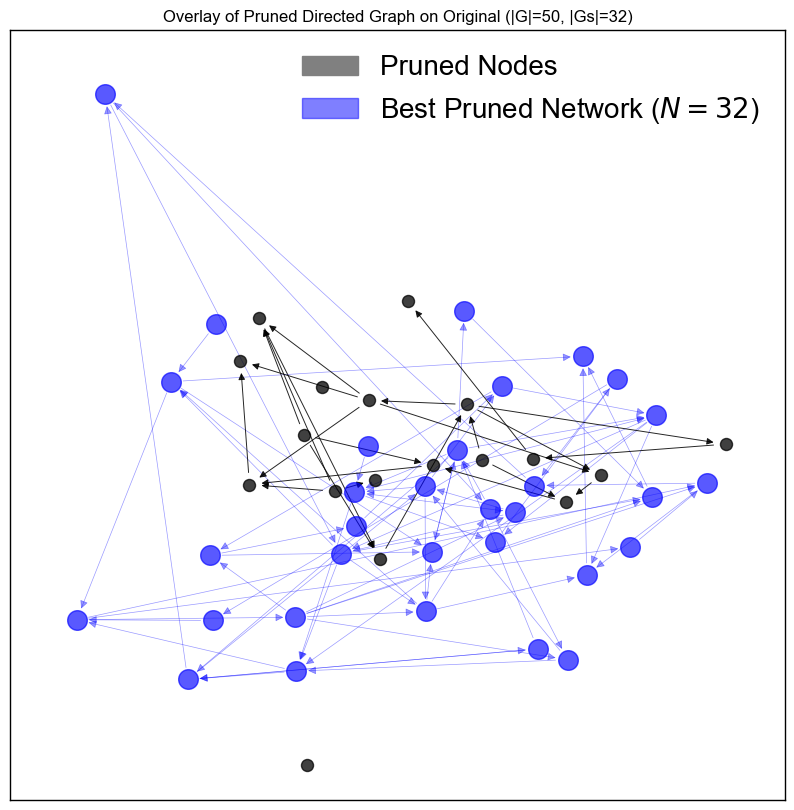

Figure saved as 'NetPlot_N5.svg'


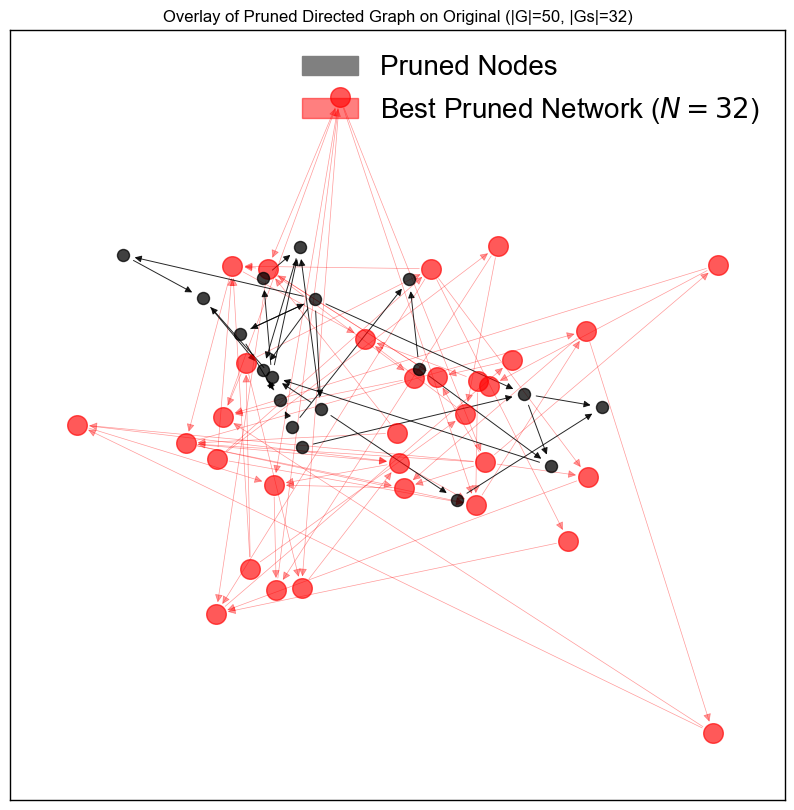

Figure saved as 'NetPlot_SC1.svg'


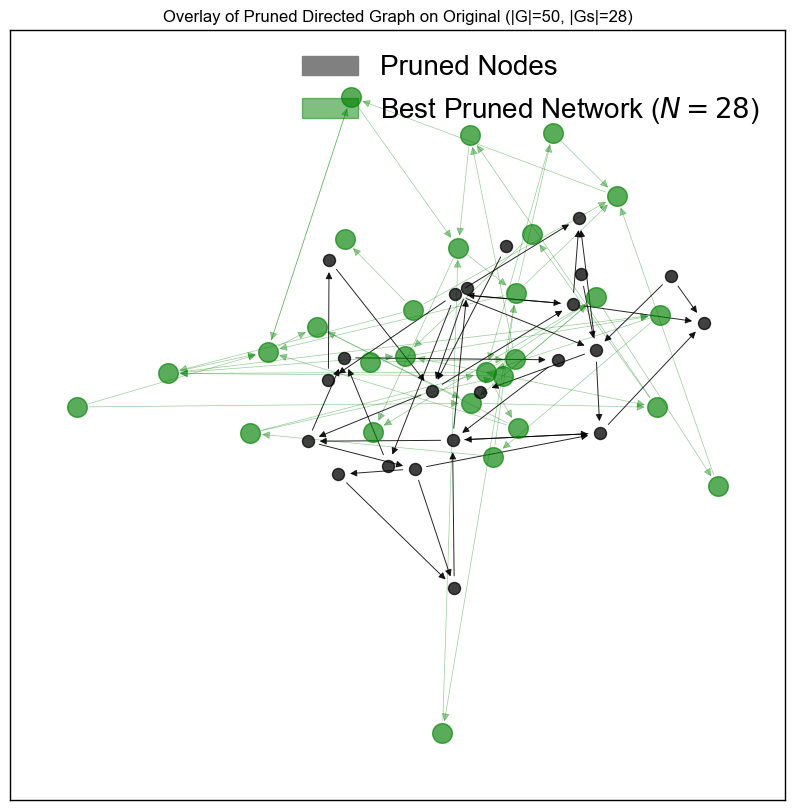

In [123]:
data = load_data("N10A1")
i= 38 #38 #28, 36
NetPlot(Model_rand=data['models'][i], Model_prun=data['models_pruned'][i], title='N10', NodeColr='blue', save_fig=True)

data = load_data("N5A1")
i= 21
NetPlot(Model_rand=data['models'][i], Model_prun=data['models_pruned'][i], title='N5', NodeColr='red', save_fig=True)


data = load_data("SC1A1")
i= 4
NetPlot(Model_rand=data['models'][i], Model_prun=data['models_pruned'][i], title='SC1', NodeColr='green', save_fig=True)


In [20]:
def Fraction_InOut_Nodes(m):
    Fr_Inps=[]; Fr_Outs=[]
    for i in range(len(m)):
        Fr_Inp = np.count_nonzero(m[i].input_layer.weights)/m[i].reservoir_layer.nodes
        Fr_Out = (m[i].readout_layer.weights.shape[0])/m[i].reservoir_layer.nodes
        Fr_Inps.append(Fr_Inp); Fr_Outs.append(Fr_Out)
    return Fr_Inps, Fr_Outs

def plot_violin(fr_init, fr_pruned, xnames, metric_name, save_fig=False):
    """Plots a violin plot for the given fraction data (Initial vs Pruned)."""

    # Check lengths before constructing DataFrame
    len_init = len(fr_init)
    len_pruned = len(fr_pruned)

    if len_init != len_pruned:
        print(f"⚠️ Warning: Length mismatch! Initial: {len_init}, Pruned: {len_pruned}")

    # Assign task labels based on actual number of data points
    task_init = np.repeat(xnames, len_init // len(xnames)).tolist()
    task_pruned = np.repeat(xnames, len_pruned // len(xnames)).tolist()

    # Ensure both lists are of the correct length
    min_len = min(len(task_init), len(fr_init))
    task_init, fr_init = task_init[:min_len], fr_init[:min_len]

    min_len = min(len(task_pruned), len(fr_pruned))
    task_pruned, fr_pruned = task_pruned[:min_len], fr_pruned[:min_len]

    # Create DataFrame
    df = pd.DataFrame({
        "Fraction": fr_init + fr_pruned,
        "Task": task_init + task_pruned,
        "Type": ["Initial"] * len(fr_init) + ["Pruned"] * len(fr_pruned)
    })

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 8))

    sns.violinplot(
        data=df, x="Task", y="Fraction", hue="Type",
        scale="width", inner="quartiles", palette={"Initial": "lightgray", "Pruned": "darkgray"},
        linewidth=1.25, ax=ax, dodge=True, cut=0
    )

    ax.set_title(metric_name, fontsize=24)
    ax.set_xlabel("Tasks", fontsize=28)
    ax.set_ylabel("Fraction", fontsize=28)
    ax.tick_params(axis='both', labelsize=20)
    plt.tight_layout()

    if save_fig:
        FIGURE_PATH = "./figures"  
        os.makedirs(FIGURE_PATH, exist_ok=True)
        filename = f"{metric_name.replace(' ', '_')}.svg"
        plt.savefig(os.path.join(FIGURE_PATH, filename), dpi=300, bbox_inches="tight")
        print(f"✅ Figure saved as '{filename}'")

    plt.show()

In [21]:
def Fraction_InOut_Nodes(m):
    Fr_Inps=[]; Fr_Outs=[]
    for i in range(len(m)):
        Fr_Inp = np.count_nonzero(m[i].input_layer.weights)/m[i].reservoir_layer.nodes
        Fr_Out = (m[i].readout_layer.weights.shape[0])/m[i].reservoir_layer.nodes
        Fr_Inps.append(Fr_Inp); Fr_Outs.append(Fr_Out)
    return Fr_Inps, Fr_Outs

def plot_violin(fr_pruned, xnames, metric_name, save_fig=False):
    """Plots a violin plot for the given fraction data (Pruned only) with a dashed reference line at y=0.5."""

    # Check length before constructing DataFrame
    len_pruned = len(fr_pruned)
    
    # Assign task labels based on actual number of data points
    task_pruned = np.repeat(xnames, len_pruned // len(xnames)).tolist()
    
    # Ensure correct length
    min_len = min(len(task_pruned), len(fr_pruned))
    task_pruned, fr_pruned = task_pruned[:min_len], fr_pruned[:min_len]
    
    # Create DataFrame
    df = pd.DataFrame({
        "Fraction": fr_pruned,
        "Task": task_pruned,
        "Type": ["Pruned"] * len(fr_pruned)
    })
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 8))
    # Add dashed reference line at y=0.5
    ax.axhline(y=0.5, color='black', linestyle='--', linewidth=2, zorder=0)
    
    # Strip plot for individual data points
    sns.stripplot(data=df, x="Task", y="Fraction", hue="Type", jitter=0.2, dodge=True,
                  palette={"Pruned": "darkgray"}, size=4, 
                  linewidth=0.75, edgecolor="gray", alpha=1, legend=None)
    sns.violinplot(
        data=df, x="Task", y="Fraction", hue="Type",
        scale="width", inner="quartiles", palette={"Pruned": "darkgray"},
        linewidth=1.25, ax=ax, dodge=True, cut=0
    )
        
    ax.set_xlabel("Tasks", fontsize=28)
    ax.set_ylabel(metric_name, fontsize=28)
    ax.tick_params(axis='both', labelsize=20)
    ax.legend().remove()
    plt.tight_layout()
    
    if save_fig:
        FIGURE_PATH = "./figures"  
        os.makedirs(FIGURE_PATH, exist_ok=True)
        filename = f"{metric_name.replace(' ', '_')}.svg"
        plt.savefig(os.path.join(FIGURE_PATH, filename), dpi=300, bbox_inches="tight")
        print(f"✅ Figure saved as '{filename}'")
    
    plt.show()


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


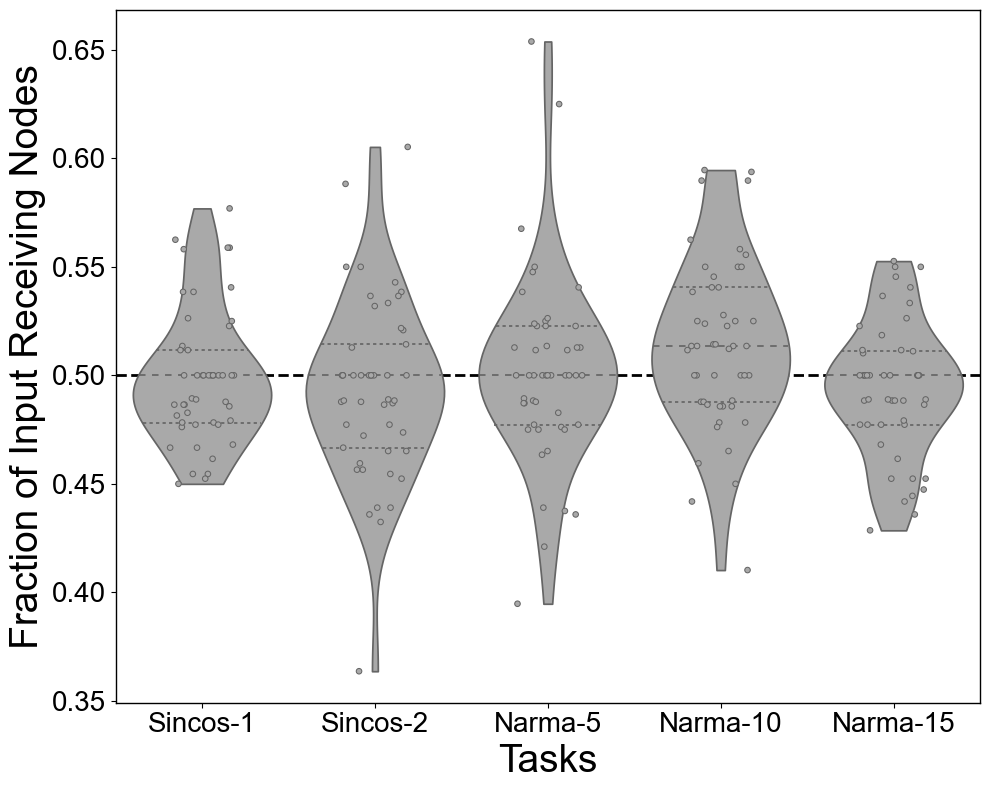

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


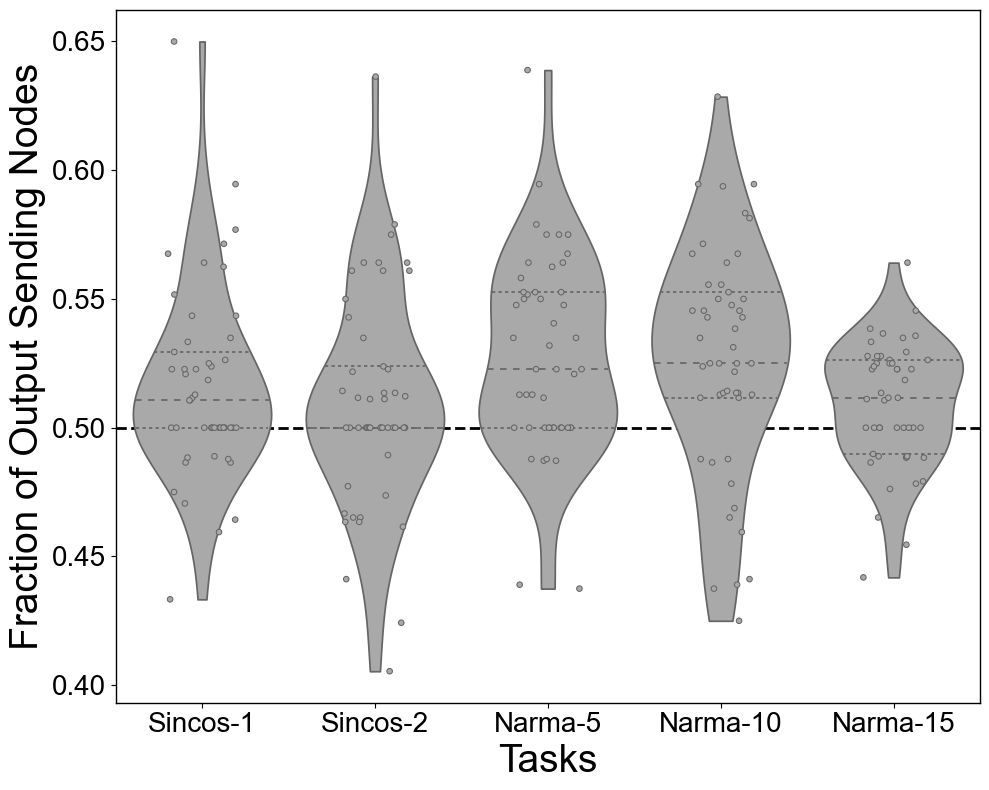

In [22]:
# Collect all input and output fractions
Fr_Inps_init, Fr_Outs_init, Fr_Inps_pruned, Fr_Outs_pruned = [], [], [], []

for case in case_group:
    data = data_dict[case]
    models = data["models"]
    models_pruned = data["models_pruned"]

    Fr_Inp, Fr_Out = Fraction_InOut_Nodes(models)
    Fr_Inp_pruned, Fr_Out_pruned = Fraction_InOut_Nodes(models_pruned)

    Fr_Inps_init.extend(Fr_Inp)
    Fr_Outs_init.extend(Fr_Out)
    Fr_Inps_pruned.extend(Fr_Inp_pruned)
    Fr_Outs_pruned.extend(Fr_Out_pruned)

# Ensure lists have the same lengths
min_len = min(len(Fr_Inps_init), len(Fr_Inps_pruned))
Fr_Inps_init, Fr_Inps_pruned = Fr_Inps_init[:min_len], Fr_Inps_pruned[:min_len]

min_len = min(len(Fr_Outs_init), len(Fr_Outs_pruned))
Fr_Outs_init, Fr_Outs_pruned = Fr_Outs_init[:min_len], Fr_Outs_pruned[:min_len]

# Generate the plots separately
plot_violin(Fr_Inps_pruned, Xnames, "Fraction of Input Receiving Nodes", save_fig=False)
plot_violin(Fr_Outs_pruned, Xnames, "Fraction of Output Sending Nodes", save_fig=False)


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedR

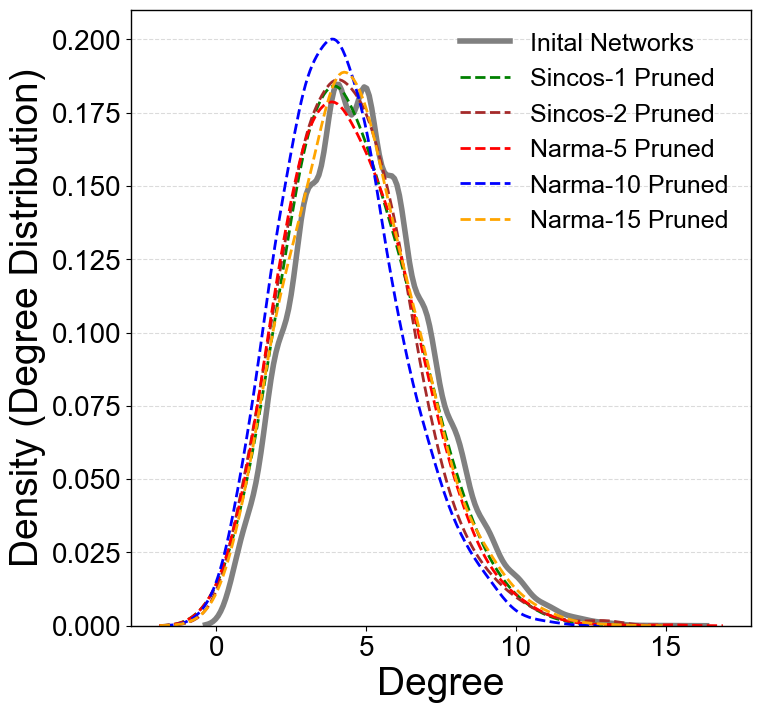

In [24]:
import seaborn as sns

def Collect_Degrees(models):
    all_degrees = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        degrees = [d for _, d in G.degree()]
        all_degrees.extend(degrees)
    return all_degrees  


case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]
Colrs = ['green', 'brown', 'red', 'blue', 'orange'] 

# Collect degrees for all models across all case groups
all_degrees_models = []
all_degrees_models_pruned = []

for case in case_group:
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Aggregate degrees from all models
    all_degrees_models.extend(Collect_Degrees(models))
    all_degrees_models_pruned.extend(Collect_Degrees(models_pruned))

# Plot all case groups together in one graph (with separate pruned for each case)
plt.figure(figsize=(8, 8))

# Plot aggregated KDE for all random models across all case groups
sns.kdeplot(all_degrees_models, color='grey', linewidth=4, bw_adjust=1.4, label="Inital Networks")

# Plot separate KDE for each case group's pruned models
for idx, case in enumerate(case_group):
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Aggregate degrees from pruned models
    Degrees_models_pruned = Collect_Degrees(models_pruned)

    # Add KDE plot for each case group's pruned models
    sns.kdeplot(Degrees_models_pruned, color=Colrs[idx], linestyle='--', linewidth=2, bw_adjust=1.4, label=f"{Xnames[idx]} Pruned")

# Customize the plot
# plt.title("Degree Distribution with KDE (Random Models Combined, Pruned Separate)", fontsize=16)
plt.xlabel("Degree", fontsize=28)
plt.ylabel("Density (Degree Distribution)", fontsize=28)
plt.tick_params(axis='both', labelsize=20)
plt.legend(fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# FIGURE_PATH = "./figures"  
# os.makedirs(FIGURE_PATH, exist_ok=True)
# filename = "NodeProP_DegDistrib.svg"
# plt.savefig(os.path.join(FIGURE_PATH, filename), dpi=300, bbox_inches="tight")

# Show the plot
plt.show()


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for degree SC1A1: [3, 2, 4, 8, 2, 2, 6, 5, 1, 7, 3, 6, 7, 3, 7, 2, 5, 3, 6, 5, 3, 6, 5, 5, 6, 2, 4, 2, 5, 3, 4, 3, 9, 2, 4, 3, 6, 2, 6, 1, 3, 2, 1, 5, 1, 5, 1, 2, 3, 2, 1, 3, 2, 2, 6, 5, 3, 6, 0, 2, 4, 3, 4, 4, 2, 4, 5, 4, 5, 8, 4, 2, 4, 6, 9, 3, 3, 1, 4, 2, 3, 2, 8, 7, 3, 1, 10, 8, 2, 7, 5, 2, 4, 5, 3, 5, 8, 4, 5, 4, 2, 7, 6, 3, 1, 5, 3, 10, 7, 2, 8, 5, 1, 8, 5, 8, 3, 5, 5, 10, 3, 4, 10, 5, 3, 8, 4, 3, 6, 3, 6, 5, 7, 6, 5, 4, 4, 4, 4, 6, 3, 5, 5, 3, 4, 4, 6, 3, 4, 4, 10, 6, 6, 5, 8, 4, 8, 7, 5, 4, 6, 10, 3, 2, 4, 3, 2, 1, 2, 2, 3, 8, 3, 2, 5, 5, 3, 4, 2, 3, 3, 4, 6, 7, 6, 2, 5, 5, 3, 4, 7, 4, 5, 6, 4, 7, 3, 8, 7, 4, 7, 6, 3, 6, 6, 7, 4, 7, 4, 5, 4, 4, 4, 7, 3, 2, 5, 1, 4, 3, 5, 7, 4, 4, 7, 4, 2, 3, 5, 3, 4, 6, 5, 5, 2, 3, 8, 3, 4, 7, 5, 5, 0, 3, 6, 5, 6, 5, 2, 6, 1, 4, 6, 8, 5, 4, 3, 6, 6, 4, 2, 5, 2, 4, 2, 5, 3, 2, 4, 6, 4, 6, 3, 4, 6, 8, 5, 6, 8, 2, 2, 3, 8, 6, 4, 9, 7, 2, 7, 2, 2, 4, 4, 3, 7, 5, 3, 2, 7, 4, 5, 8, 5, 7, 3, 4, 6, 6, 5, 4, 8, 2, 4, 3, 8, 6, 8, 8, 

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for degree SC3A1: [5, 6, 3, 5, 5, 4, 5, 1, 9, 5, 4, 4, 5, 6, 2, 2, 4, 4, 2, 2, 5, 3, 4, 2, 4, 4, 6, 5, 8, 6, 4, 3, 2, 3, 6, 2, 5, 3, 9, 4, 5, 3, 6, 4, 8, 7, 3, 4, 2, 3, 4, 6, 1, 3, 5, 3, 4, 5, 3, 8, 7, 7, 0, 5, 4, 4, 8, 1, 2, 5, 3, 2, 4, 1, 4, 5, 6, 6, 4, 4, 1, 3, 3, 5, 4, 4, 5, 3, 9, 4, 4, 2, 6, 5, 9, 2, 4, 5, 4, 5, 9, 5, 3, 5, 5, 3, 5, 4, 6, 3, 7, 5, 4, 6, 5, 5, 5, 3, 4, 3, 5, 3, 3, 5, 2, 6, 5, 6, 5, 5, 6, 1, 3, 5, 3, 5, 6, 5, 0, 6, 6, 7, 5, 2, 5, 3, 1, 4, 3, 3, 2, 6, 2, 6, 6, 3, 1, 3, 7, 3, 4, 13, 4, 2, 4, 13, 5, 2, 6, 2, 4, 6, 7, 4, 5, 6, 1, 8, 5, 3, 6, 5, 6, 5, 2, 5, 7, 8, 7, 2, 3, 2, 6, 4, 7, 10, 5, 5, 5, 4, 4, 3, 2, 3, 4, 5, 1, 5, 5, 5, 9, 4, 6, 7, 7, 4, 5, 7, 5, 3, 6, 6, 4, 5, 6, 6, 3, 5, 9, 3, 3, 2, 4, 7, 5, 6, 4, 6, 5, 6, 5, 3, 3, 5, 6, 7, 5, 2, 7, 5, 6, 6, 1, 8, 7, 6, 4, 6, 3, 9, 9, 7, 5, 2, 7, 5, 2, 5, 5, 7, 4, 7, 3, 3, 7, 7, 5, 1, 7, 6, 4, 6, 4, 4, 3, 9, 5, 6, 4, 5, 5, 3, 2, 6, 5, 5, 3, 5, 4, 2, 8, 2, 3, 4, 3, 6, 4, 4, 3, 5, 7, 5, 6, 4, 2, 4, 4, 3, 3, 

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for degree N5A1: [5, 3, 3, 4, 3, 7, 7, 7, 5, 4, 2, 4, 8, 2, 8, 2, 3, 6, 6, 1, 2, 5, 2, 4, 4, 2, 5, 3, 3, 4, 3, 6, 2, 4, 4, 5, 9, 4, 4, 3, 6, 5, 3, 4, 7, 6, 4, 4, 2, 4, 6, 5, 5, 9, 6, 5, 5, 2, 6, 2, 4, 5, 7, 3, 2, 6, 6, 4, 6, 4, 2, 4, 4, 4, 5, 5, 7, 4, 3, 4, 4, 3, 3, 3, 5, 3, 9, 5, 2, 2, 7, 1, 1, 5, 6, 7, 6, 4, 4, 2, 2, 5, 4, 4, 4, 5, 5, 3, 3, 4, 3, 5, 2, 6, 6, 6, 4, 6, 5, 5, 5, 9, 4, 2, 5, 2, 1, 2, 4, 1, 4, 3, 3, 3, 6, 3, 3, 2, 6, 3, 8, 2, 3, 0, 2, 1, 4, 2, 7, 8, 3, 4, 3, 5, 6, 4, 1, 3, 4, 1, 4, 5, 6, 5, 7, 7, 3, 5, 5, 4, 7, 5, 6, 7, 7, 7, 6, 3, 4, 3, 7, 2, 6, 6, 4, 3, 8, 1, 4, 9, 6, 2, 5, 3, 6, 6, 3, 3, 4, 4, 3, 1, 7, 4, 3, 4, 2, 2, 4, 6, 1, 6, 5, 5, 3, 3, 1, 5, 2, 3, 4, 2, 5, 4, 4, 3, 5, 1, 7, 4, 5, 9, 4, 6, 5, 5, 3, 5, 2, 5, 3, 4, 2, 2, 2, 5, 5, 6, 2, 2, 4, 2, 3, 3, 5, 9, 6, 1, 5, 3, 6, 6, 2, 3, 5, 7, 7, 6, 8, 4, 5, 1, 5, 4, 2, 5, 4, 3, 7, 6, 9, 8, 10, 3, 7, 8, 2, 10, 6, 3, 7, 5, 5, 9, 6, 7, 9, 4, 3, 3, 5, 6, 6, 6, 3, 8, 3, 7, 10, 5, 8, 6, 4, 5, 6, 7, 7, 7, 10, 

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for degree N15A1: [6, 3, 3, 6, 5, 6, 4, 5, 6, 5, 4, 1, 5, 6, 0, 5, 3, 5, 5, 4, 2, 3, 7, 5, 7, 3, 4, 5, 6, 2, 6, 5, 5, 4, 4, 13, 3, 3, 7, 2, 4, 2, 4, 6, 4, 11, 2, 4, 5, 4, 4, 4, 12, 8, 3, 2, 5, 2, 8, 4, 4, 5, 6, 4, 6, 6, 6, 4, 6, 6, 7, 7, 3, 7, 5, 5, 9, 5, 6, 2, 4, 3, 4, 1, 1, 5, 4, 7, 4, 2, 7, 3, 3, 5, 3, 5, 4, 5, 5, 1, 6, 6, 12, 8, 11, 3, 11, 6, 4, 3, 7, 6, 5, 4, 2, 9, 9, 4, 5, 8, 6, 10, 8, 8, 7, 11, 2, 9, 3, 7, 5, 5, 10, 5, 7, 4, 5, 5, 5, 5, 5, 8, 3, 6, 5, 8, 5, 9, 9, 6, 5, 6, 4, 7, 4, 2, 3, 4, 4, 4, 8, 2, 8, 7, 5, 1, 7, 3, 1, 11, 3, 6, 7, 3, 7, 7, 7, 10, 4, 8, 5, 3, 5, 5, 6, 5, 8, 4, 4, 2, 7, 3, 2, 9, 6, 2, 4, 1, 4, 3, 2, 6, 3, 1, 5, 3, 2, 6, 3, 3, 5, 4, 1, 3, 6, 7, 8, 4, 4, 2, 2, 6, 5, 3, 5, 4, 6, 3, 6, 3, 1, 3, 2, 1, 9, 5, 8, 4, 6, 5, 3, 3, 8, 7, 5, 1, 4, 3, 7, 10, 4, 3, 4, 7, 1, 3, 3, 3, 9, 3, 5, 3, 4, 4, 8, 2, 6, 6, 5, 4, 3, 4, 3, 7, 2, 1, 4, 4, 5, 5, 6, 7, 6, 2, 4, 5, 5, 0, 7, 5, 7, 7, 4, 9, 5, 8, 4, 2, 4, 5, 5, 7, 4, 6, 6, 5, 2, 7, 4, 3, 2, 6, 5, 4, 6, 2, 

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


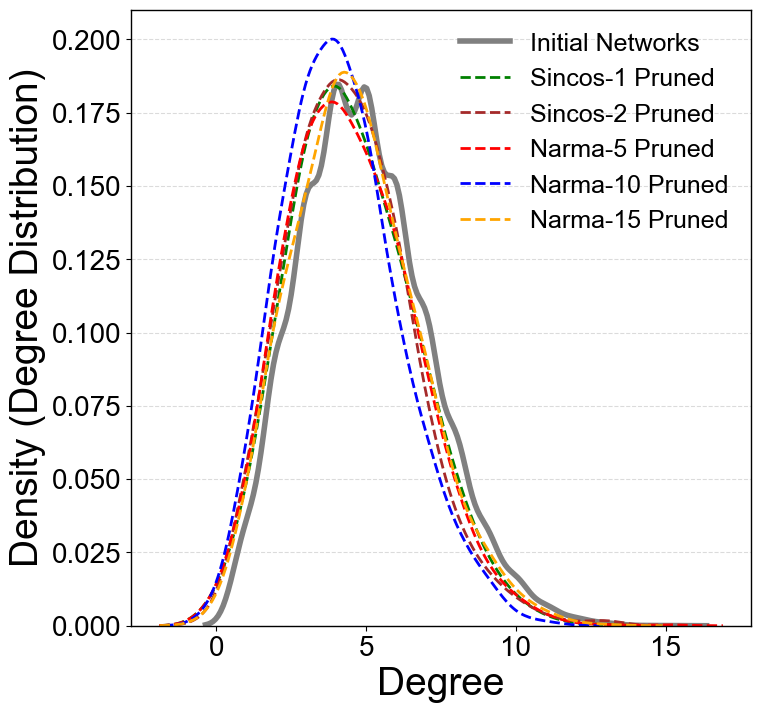

Results for SC1A1:
  Average Initial Degree: 4.932
  Average Pruned Degree: 4.546078431372549
  Cohen's d: 0.18356288989491687
  KS Statistic: 0.07518039215686274
  KS p-value: 5.673232018341975e-06
Results for SC3A1:
  Average Initial Degree: 4.8272
  Average Pruned Degree: 4.446043165467626
  Cohen's d: 0.18455120868005429
  KS Statistic: 0.08109064748201439
  KS p-value: 5.903719250682785e-07
Results for N5A1:
  Average Initial Degree: 4.944
  Average Pruned Degree: 4.484013772749631
  Cohen's d: 0.2167994670222486
  KS Statistic: 0.08182134776192819
  KS p-value: 5.549221171027219e-07
Results for N10A1:
  Average Initial Degree: 5.0152
  Average Pruned Degree: 4.149269311064718
  Cohen's d: 0.42677406331120726
  KS Statistic: 0.16537453027139876
  KS p-value: 2.2831845683211516e-26
Results for N15A1:
  Average Initial Degree: 4.994285714285715
  Average Pruned Degree: 4.62481892805408
  Cohen's d: 0.1744827365058534
  KS Statistic: 0.06855625301786576
  KS p-value: 4.90555790625323

In [29]:
from scipy import stats
from scipy.stats import ks_2samp

# Collect Degree Distribution from models
def Collect_Degrees(models):
    all_degrees = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        degrees = [d for _, d in G.degree()]
        all_degrees.extend(degrees)
    return all_degrees

# Cohen's d for effect size
def cohen_d(initial, pruned):
    mean_initial = np.mean(initial)
    mean_pruned = np.mean(pruned)
    std_initial = np.std(initial)
    std_pruned = np.std(pruned)
    
    pooled_std = np.sqrt(((std_initial ** 2) + (std_pruned ** 2)) / 2)
    d = (mean_initial - mean_pruned) / pooled_std
    return d

# Kolmogorov-Smirnov Test
def ks_test(initial, pruned):
    statistic, p_value = ks_2samp(initial, pruned)
    return statistic, p_value

# Analyze Degree Distributions
def analyze_degrees(models, models_pruned):
    initial_degrees = Collect_Degrees(models)
    pruned_degrees = Collect_Degrees(models_pruned)

    avg_initial = np.mean(initial_degrees)
    avg_pruned = np.mean(pruned_degrees)

    cohen_d_value = cohen_d(initial_degrees, pruned_degrees)
    ks_statistic, ks_p_value = ks_test(initial_degrees, pruned_degrees)

    return {
        "Average Initial Degree": avg_initial,
        "Average Pruned Degree": avg_pruned,
        "Cohen's d": cohen_d_value,
        "KS Statistic": ks_statistic,
        "KS p-value": ks_p_value
    }

# Case group for analysis
case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]
Colrs = ['green', 'brown', 'red', 'blue', 'orange'] 

# Collect degrees for all models across all case groups
all_degrees_models = []
all_degrees_models_pruned = []

# Results for each case group
results = []

for case in case_group:
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Analyze degree distributions for each case
    case_result = analyze_degrees(models, models_pruned)
    results.append((case, case_result))

    # Aggregate degrees from all models
    all_degrees_models.extend(Collect_Degrees(models))
    all_degrees_models_pruned.extend(Collect_Degrees(models_pruned))

# Plot all case groups together in one graph (with separate pruned for each case)
plt.figure(figsize=(8, 8))

# Plot aggregated KDE for all random models across all case groups
sns.kdeplot(all_degrees_models, color='grey', linewidth=4, bw_adjust=1.4, label="Initial Networks")

# Plot separate KDE for each case group's pruned models
for idx, case in enumerate(case_group):
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Aggregate degrees from pruned models
    Degrees_models_pruned = Collect_Degrees(models_pruned)
    print(f"model pruned Results for degree {case}:", Degrees_models_pruned)
    # Add KDE plot for each case group's pruned models
    sns.kdeplot(Degrees_models_pruned, color=Colrs[idx], linestyle='--', linewidth=2, bw_adjust=1.4, label=f"{Xnames[idx]} Pruned")

# Customize the plot
plt.xlabel("Degree", fontsize=28)
plt.ylabel("Density (Degree Distribution)", fontsize=28)
plt.tick_params(axis='both', labelsize=20)
plt.legend(fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()

# Print the results of the degree distribution analysis
for case, result in results:
    print(f"Results for {case}:")
    for metric, value in result.items():
        print(f"  {metric}: {value}")


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for reciprocity SC1A1: [0.08, 0.09090909090909091, 0.06956521739130435, 0.03125, 0.0392156862745098, 0.037037037037037035, 0.025, 0.031746031746031744, 0.0, 0.14814814814814814, 0.017391304347826087, 0.0594059405940594, 0.017241379310344827, 0.10526315789473684, 0.08080808080808081, 0.023529411764705882, 0.10084033613445378, 0.06557377049180328, 0.08823529411764706, 0.08421052631578947, 0.10810810810810811, 0.08421052631578947, 0.017543859649122806, 0.03669724770642202, 0.1, 0.04819277108433735, 0.075, 0.058823529411764705, 0.2222222222222222, 0.0, 0.07874015748031496, 0.08602150537634409, 0.020618556701030927, 0.09090909090909091, 0.03305785123966942, 0.03508771929824561, 0.05, 0.015873015873015872, 0.07547169811320754, 0.023529411764705882, 0.04395604395604396, 0.08602150537634409, 0.02877697841726619, 0.05714285714285714, 0.09411764705882353, 0.05405405405405406, 0.09230769230769231, 0.0425531914893617, 0.08163265306122448, 0.020202020202020204]


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for reciprocity SC3A1: [0.0392156862745098, 0.08108108108108109, 0.02127659574468085, 0.07142857142857142, 0.038834951456310676, 0.0625, 0.07142857142857142, 0.061855670103092786, 0.017543859649122806, 0.0, 0.09022556390977443, 0.08695652173913043, 0.12195121951219512, 0.08, 0.09090909090909091, 0.0, 0.07017543859649122, 0.05063291139240506, 0.01818181818181818, 0.05555555555555555, 0.07920792079207921, 0.0625, 0.023255813953488372, 0.06315789473684211, 0.06521739130434782, 0.08695652173913043, 0.04878048780487805, 0.0, 0.035398230088495575, 0.05128205128205128, 0.04, 0.10344827586206896, 0.03361344537815126, 0.056074766355140186, 0.08333333333333333, 0.05357142857142857, 0.07407407407407407, 0.06896551724137931, 0.09836065573770492, 0.0449438202247191, 0.07894736842105263, 0.024390243902439025, 0.0547945205479452, 0.08403361344537816, 0.05263157894736842, 0.06896551724137931, 0.11235955056179775, 0.07692307692307693, 0.0392156862745098, 0.10309278350515463]


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for reciprocity N5A1: [0.04395604395604396, 0.06741573033707865, 0.09090909090909091, 0.030303030303030304, 0.041237113402061855, 0.1095890410958904, 0.0, 0.06535947712418301, 0.136986301369863, 0.023255813953488372, 0.06557377049180328, 0.0625, 0.06349206349206349, 0.09876543209876543, 0.0594059405940594, 0.046875, 0.06060606060606061, 0.0, 0.05042016806722689, 0.04395604395604396, 0.061855670103092786, 0.03125, 0.046511627906976744, 0.0, 0.1, 0.05357142857142857, 0.07692307692307693, 0.05755395683453238, 0.030303030303030304, 0.019417475728155338, 0.04081632653061224, 0.08333333333333333, 0.11363636363636363, 0.049586776859504134, 0.07142857142857142, 0.09448818897637795, 0.06818181818181818, 0.04878048780487805, 0.028169014084507043, 0.02127659574468085, 0.018867924528301886, 0.16494845360824742, 0.0380952380952381, 0.11267605633802817, 0.023255813953488372, 0.07692307692307693, 0.10256410256410256, 0.0963855421686747, 0.047619047619047616, 0.043478260869565216]

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


model pruned Results for reciprocity N10A1: [0.1, 0.0, 0.058823529411764705, 0.1518987341772152, 0.06593406593406594, 0.022988505747126436, 0.11627906976744186, 0.07692307692307693, 0.05405405405405406, 0.05128205128205128, 0.0625, 0.0, 0.0449438202247191, 0.04395604395604396, 0.0, 0.06451612903225806, 0.06666666666666667, 0.09411764705882353, 0.0967741935483871, 0.02247191011235955, 0.09090909090909091, 0.019801980198019802, 0.0547945205479452, 0.05, 0.14, 0.11904761904761904, 0.0, 0.06451612903225806, 0.10714285714285714, 0.11764705882352941, 0.028169014084507043, 0.057971014492753624, 0.1, 0.07142857142857142, 0.09836065573770492, 0.06593406593406594, 0.057971014492753624, 0.09836065573770492, 0.056338028169014086, 0.05555555555555555, 0.05555555555555555, 0.11627906976744186, 0.03305785123966942, 0.13513513513513514, 0.0625, 0.023809523809523808, 0.0, 0.08450704225352113, 0.056338028169014086, 0.10126582278481013]
model pruned Results for reciprocity N15A1: [0.1016949152542373, 0.0

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


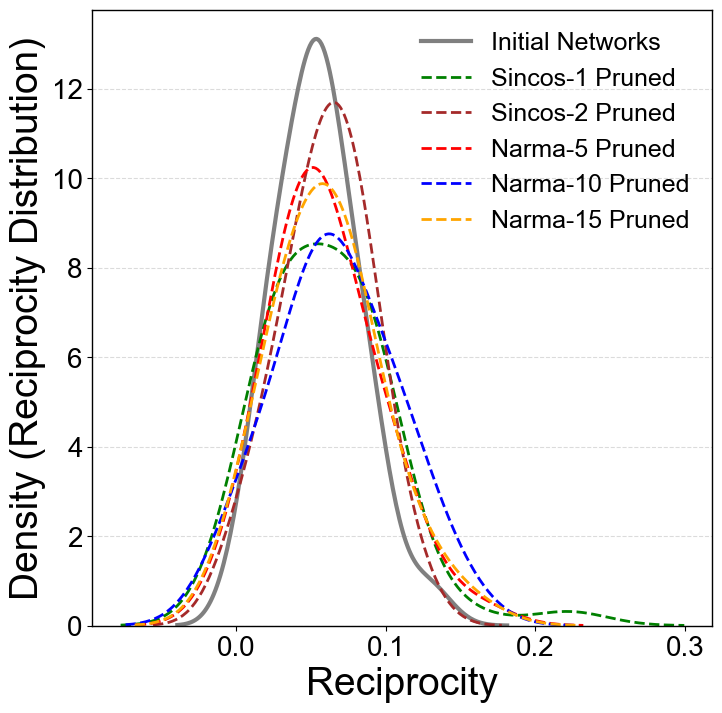

Results for SC1A1:
Average Initial Reciprocity: 0.05481507517791754
Average Pruned Reciprocity: 0.06112484655209298
Absolute Change: 0.006309771374175439
Relative Change (%): 11.51101472303983
Cohen's d: 0.17730575276109078
KS Statistic: [1. 1. 0. 1. 1. 1. 1. 0. 0. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.
 1. 1.]
KS p-value: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1.]


Results for SC3A1:
Average Initial Reciprocity: 0.05367535042922009
Average Pruned Reciprocity: 0.059944973504236325
Absolute Change: 0.006269623075016238
Relative Change (%): 11.680637433906991
Cohen's d: 0.250835057233517
KS Statistic: [1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1.
 1. 1.]
KS p-value: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

In [30]:
def Collect_Reciprocity(models):
    all_reciprocity = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        reciprocity = nx.reciprocity(G)
        all_reciprocity.append(reciprocity)
    return all_reciprocity

# Collect reciprocity and bridges for all models across all case groups
all_reciprocity_models = []
all_reciprocity_models_pruned = []

for case in case_group:
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Aggregate reciprocity from all models
    all_reciprocity_models.extend(Collect_Reciprocity(models))
    all_reciprocity_models_pruned.extend(Collect_Reciprocity(models_pruned))
    
# Plot all case groups together in one graph (with separate pruned for each case)
plt.figure(figsize=(8, 8))

# Plot aggregated KDE for all reciprocity across all case groups
sns.kdeplot(all_reciprocity_models, color='grey', linewidth=3, bw_adjust=1.4, label="Initial Networks")

# Plot separate KDE for each case group's pruned models
for idx, case in enumerate(case_group):
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Aggregate reciprocity from pruned models
    Reciprocity_models_pruned = Collect_Reciprocity(models_pruned)
    print(f"model pruned Results for reciprocity {case}:", Reciprocity_models_pruned)
    # Add KDE plot for each case group's pruned models
    sns.kdeplot(Reciprocity_models_pruned, color=Colrs[idx], linestyle='--', linewidth=2, bw_adjust=1.4, label=f"{Xnames[idx]} Pruned")

# Customize the plot
plt.xlabel("Reciprocity", fontsize=28)
plt.ylabel("Density (Reciprocity Distribution)", fontsize=28)
plt.tick_params(axis='both', labelsize=20)
plt.legend(fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.title("Reciprocity Distribution with KDE (Initial and Pruned Networks)", fontsize=16)

# FIGURE_PATH = "./figures"  
# os.makedirs(FIGURE_PATH, exist_ok=True)
# filename = "NodeProP_RecipDistrib.svg"
# plt.savefig(os.path.join(FIGURE_PATH, filename), dpi=300, bbox_inches="tight")

plt.show()


def average_reciprocity(models):
    reciprocity_values = Collect_Reciprocity(models)
    return np.mean(reciprocity_values)

def relative_change(initial, pruned):
    return (np.mean(pruned) - np.mean(initial)) / np.mean(initial)

def cohen_d(initial, pruned):
    mean_initial = np.mean(initial)
    mean_pruned = np.mean(pruned)
    std_initial = np.std(initial)
    std_pruned = np.std(pruned)
    pooled_std = np.sqrt((std_initial**2 + std_pruned**2) / 2)
    return (mean_pruned - mean_initial) / pooled_std

def ks_test(initial, pruned):
    ks_statistic, p_value = stats.ks_2samp(initial, pruned)
    return ks_statistic, p_value


def analyze_reciprocity(models, models_pruned):
    # Collect reciprocity for initial and pruned models
    initial_reciprocity = [Collect_Reciprocity(models)]
    pruned_reciprocity = [Collect_Reciprocity(models_pruned)]

    # Calculate all measures
    avg_initial = np.mean(initial_reciprocity)
    avg_pruned = np.mean(pruned_reciprocity)
    abs_change = np.abs(avg_pruned - avg_initial)
    rel_change = relative_change(initial_reciprocity, pruned_reciprocity)
    cohen_d_value = cohen_d(initial_reciprocity, pruned_reciprocity)
    ks_statistic, ks_p_value = ks_test(initial_reciprocity, pruned_reciprocity)
    return {
        "Average Initial Reciprocity": avg_initial,
        "Average Pruned Reciprocity": avg_pruned,
        "Absolute Change": abs_change,
        "Relative Change (%)": rel_change * 100,
        "Cohen's d": cohen_d_value,
        "KS Statistic": ks_statistic,
        "KS p-value": ks_p_value
    }

# Collect reciprocity and bridges for all models across all case groups
case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]
Colrs = ['green', 'brown', 'red', 'blue', 'orange']

results = []

for case in case_group:
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Analyze reciprocity for each case
    case_result = analyze_reciprocity(models, models_pruned)
    results.append((case, case_result))

# Print results
for case, result in results:
    print(f"Results for {case}:")
    for key, value in result.items():
        print(f"{key}: {value}")
    print("\n")

In [31]:
# Collect Degree and Reciprocity for models
def Collect_Degrees(models):
    all_degrees = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        degrees = [d for _, d in G.degree()]
        all_degrees.extend(degrees)
    return all_degrees

def Collect_Reciprocity(models):
    all_reciprocity = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        reciprocity = nx.reciprocity(G)
        all_reciprocity.append(reciprocity)
    return all_reciprocity

# Collect results for all cases
case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]

# Create empty lists for storing data
data = []

for case in case_group:
    # Load models for each case
    data_case = load_data(case)
    models = data_case["models"]
    models_pruned = data_case["models_pruned"]
    
    # Collect initial and pruned degree and reciprocity
    initial_degrees = Collect_Degrees(models)
    pruned_degrees = Collect_Degrees(models_pruned)
    
    initial_reciprocity = Collect_Reciprocity(models)
    pruned_reciprocity = Collect_Reciprocity(models_pruned)
    
    # Calculate averages
    avg_initial_degree = np.mean(initial_degrees)
    avg_pruned_degree = np.mean(pruned_degrees)
    
    avg_initial_reciprocity = np.mean(initial_reciprocity)
    avg_pruned_reciprocity = np.mean(pruned_reciprocity)
    
    # Calculate percent change for degree and reciprocity
    percent_change_degree = ((avg_pruned_degree - avg_initial_degree) / avg_initial_degree) * 100
    percent_change_reciprocity = ((avg_pruned_reciprocity - avg_initial_reciprocity) / avg_initial_reciprocity) * 100
    
    # Append data to the list
    data.append({
        'Case': case,
        'Initial Degree': avg_initial_degree,
        'Pruned Degree': avg_pruned_degree,
        'Degree % Change': percent_change_degree,
        'Initial Reciprocity': avg_initial_reciprocity,
        'Pruned Reciprocity': avg_pruned_reciprocity,
        'Reciprocity % Change': percent_change_reciprocity
    })

# Create a DataFrame from the collected data
df = pd.DataFrame(data)
df

,Case,Initial Degree,Pruned Degree,Degree % Change,Initial Reciprocity,Pruned Reciprocity,Reciprocity % Change
0,SC1A1,4.932000,4.546078,-7.824849,0.054815,0.061125,11.511015
1,SC3A1,4.827200,4.446043,-7.896023,0.053675,0.059945,11.680637
2,N5A1,4.944000,4.484014,-9.303929,0.056016,0.059650,6.488451
3,N10A1,5.015200,4.149269,-17.266125,0.058186,0.066331,13.998221
4,N15A1,4.994286,4.624819,-7.397790,0.051429,0.060627,17.885370


In [32]:
# Collect Degree, Reciprocity and SCC for models
def Collect_Degrees(models):
    all_degrees = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        degrees = [d for _, d in G.degree()]
        all_degrees.extend(degrees)
    return all_degrees

def Collect_Reciprocity(models):
    all_reciprocity = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        reciprocity = nx.reciprocity(G)
        all_reciprocity.append(reciprocity)
    return all_reciprocity

def Collect_SCC(models):
    all_scc = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        scc = list(nx.strongly_connected_components(G))
        all_scc.append(len(scc))  # Number of SCCs
    return all_scc

# Collect results for all cases
case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]

# Create empty lists for storing data
data = []

for case in case_group:
    # Load models for each case
    data_case = load_data(case)
    models = data_case["models"]
    models_pruned = data_case["models_pruned"]
    
    # Collect initial and pruned degree, reciprocity, and SCC
    initial_degrees = Collect_Degrees(models)
    pruned_degrees = Collect_Degrees(models_pruned)
    
    initial_reciprocity = Collect_Reciprocity(models)
    pruned_reciprocity = Collect_Reciprocity(models_pruned)
    
    initial_scc = Collect_SCC(models)
    pruned_scc = Collect_SCC(models_pruned)
    
    # Calculate averages
    avg_initial_degree = np.mean(initial_degrees)
    avg_pruned_degree = np.mean(pruned_degrees)
    
    avg_initial_reciprocity = np.mean(initial_reciprocity)
    avg_pruned_reciprocity = np.mean(pruned_reciprocity)
    
    avg_initial_scc = np.mean(initial_scc)
    avg_pruned_scc = np.mean(pruned_scc)
    
    # Calculate percent change for degree, reciprocity, and SCC
    percent_change_degree = ((avg_pruned_degree - avg_initial_degree) / avg_initial_degree) * 100
    percent_change_reciprocity = ((avg_pruned_reciprocity - avg_initial_reciprocity) / avg_initial_reciprocity) * 100
    percent_change_scc = ((avg_pruned_scc - avg_initial_scc) / avg_initial_scc) * 100
    
    # Append data to the list
    data.append({
        'Case': case,
        'Initial Degree': avg_initial_degree,
        'Pruned Degree': avg_pruned_degree,
        'Degree % Change': percent_change_degree,
        'Initial Reciprocity': avg_initial_reciprocity,
        'Pruned Reciprocity': avg_pruned_reciprocity,
        'Reciprocity % Change': percent_change_reciprocity,
        'Initial SCC': avg_initial_scc,
        'Pruned SCC': avg_pruned_scc,
        'SCC % Change': percent_change_scc
    })

# Create a DataFrame from the collected data
df = pd.DataFrame(data)
df

,Case,Initial Degree,Pruned Degree,Degree % Change,Initial Reciprocity,Pruned Reciprocity,Reciprocity % Change,Initial SCC,Pruned SCC,SCC % Change
0,SC1A1,4.932000,4.546078,-7.824849,0.054815,0.061125,11.511015,11.540000,10.100000,-12.478336
1,SC3A1,4.827200,4.446043,-7.896023,0.053675,0.059945,11.680637,11.660000,10.580000,-9.262436
2,N5A1,4.944000,4.484014,-9.303929,0.056016,0.059650,6.488451,10.360000,9.920000,-4.247104
3,N10A1,5.015200,4.149269,-17.266125,0.058186,0.066331,13.998221,10.360000,12.520000,20.849421
4,N15A1,4.994286,4.624819,-7.397790,0.051429,0.060627,17.885370,10.081633,8.408163,-16.599190


c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


SCC models: [1, 1, 1, 1, 1, 41, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 28, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 41, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 1, 1, 1, 1, 1, 48, 1, 1, 1, 2, 1, 1, 38, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 34, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 39, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 1, 1, 1, 1, 1, 1, 1, 1, 1, 39, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 34, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 42, 1, 1, 1, 1, 1, 1, 1, 1, 43, 1, 1, 1, 1, 37, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 39, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 47, 1, 1, 1, 1, 42, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 1, 1, 1, 1, 1, 1, 1, 1, 46, 1, 1, 1, 1, 1, 1, 1, 39, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 25, 1, 1, 1, 1, 1, 1, 40, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 44, 1, 1, 1, 1, 1, 1, 44, 1, 1, 1, 1, 1, 37, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 36, 1, 1, 1, 1, 1, 1, 1, 2, 1, 41, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 39, 1, 1, 1, 1, 1,

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Case: SC3A1 SCC models pruned: [1, 1, 32, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 30, 1, 1, 1, 40, 1, 1, 1, 1, 1, 27, 1, 1, 1, 1, 1, 1, 1, 1, 1, 34, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 42, 1, 1, 1, 1, 38, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 34, 1, 1, 1, 1, 1, 1, 1, 37, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 36, 1, 1, 1, 1, 1, 1, 1, 1, 48, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 27, 1, 1, 1, 1, 1, 1, 1, 1, 34, 1, 1, 1, 1, 1, 1, 1, 25, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 30, 1, 1, 1, 1, 1, 1, 1, 19, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 40, 1, 1, 1, 1, 1, 1, 33, 1, 42, 1, 1, 1, 1, 1, 1, 1, 39, 1, 1, 1, 1, 1, 1, 44, 1, 1, 1, 1, 1, 34, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 31, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 31, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 30, 1, 1, 1, 1, 1, 1, 1, 1, 28, 1, 1, 1, 1, 1, 1, 42, 1, 1, 1, 1, 1, 1, 1, 1, 1, 13, 1, 1, 1, 1, 1, 1, 1, 38, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 25, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 41, 1, 1, 1, 1, 1, 1, 40, 1, 1, 1, 1, 1, 1, 1, 1, 37, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Case: N10A1 SCC models pruned: [1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 21, 1, 1, 1, 1, 1, 1, 1, 1, 27, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 30, 1, 1, 1, 1, 1, 1, 1, 1, 1, 36, 1, 1, 1, 1, 1, 1, 1, 1, 30, 1, 1, 1, 1, 1, 1, 29, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 29, 1, 1, 1, 1, 1, 1, 15, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 33, 1, 1, 1, 1, 1, 1, 1, 1, 1, 26, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 14, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 28, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 1, 36, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 25, 1, 1, 1, 1, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 15, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 31, 1, 1, 1, 1, 1, 37, 1, 1, 1, 1, 1, 1, 1, 1, 1, 27, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 16, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 1, 1, 1, 1, 32, 1, 1, 1, 1, 31, 1,

c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Work\TU-Berlin\Projects\2.RC_DynamicNets\7.Pruning_RC\PrunedRC\.env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


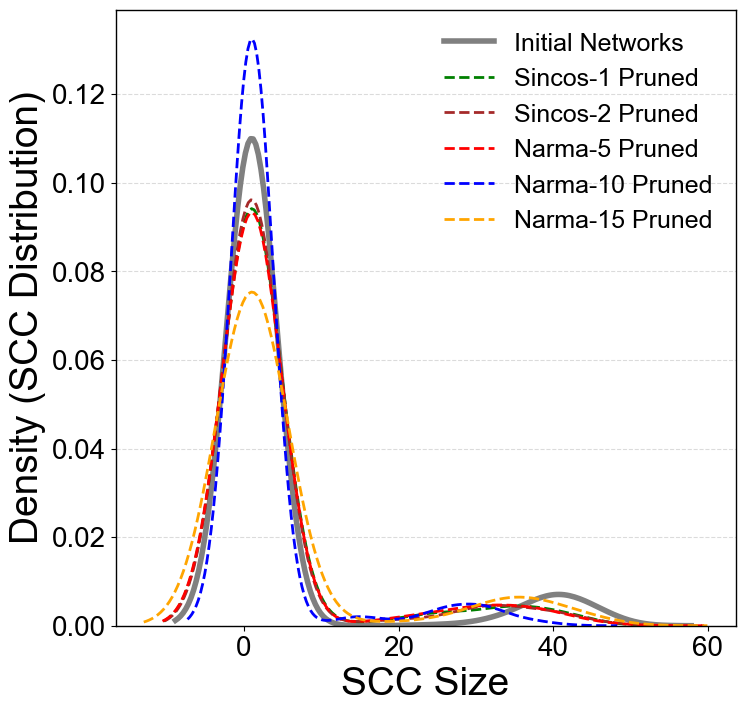

In [33]:
# Function to collect Strongly Connected Components (for directed graphs)
def Collect_SCC(models):
    all_scc = []
    for model in models:
        adj_matrix = model.reservoir_layer.weights
        G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)
        scc = list(nx.strongly_connected_components(G))
        all_scc.extend([len(comp) for comp in scc])  # Size of each strongly connected component
    return all_scc

# Load data and initialize case groups
case_group = ["SC1A1", "SC3A1", "N5A1", "N10A1", "N15A1"]
Xnames = ["Sincos-1", "Sincos-2", "Narma-5", "Narma-10", "Narma-15"]
Colrs = ['green', 'brown', 'red', 'blue', 'orange'] 

# Initialize lists to collect properties
all_scc_models = []
all_scc_models_pruned = []

# Collect properties for each case
for case in case_group:
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    # Aggregate strongly connected components from all models
    all_scc_models.extend(Collect_SCC(models))
    all_scc_models_pruned.extend(Collect_SCC(models_pruned))


# Plot distributions for Strongly Connected Components (SCC)
plt.figure(figsize=(8, 8))

# Plot aggregated KDE for all random models (Initial)
sns.kdeplot(all_scc_models, color='grey', linewidth=4, bw_adjust=1.4, label="Initial Networks")
print('SCC models:', all_scc_models)
# Plot separate KDE for each case group's pruned models
for idx, case in enumerate(case_group):
    data = load_data(case)
    models = data["models"]
    models_pruned = data["models_pruned"]

    SCC_models_pruned = Collect_SCC(models_pruned)
    print('Case:',case, 'SCC models pruned:', SCC_models_pruned)
    sns.kdeplot(SCC_models_pruned, color=Colrs[idx], linestyle='--', linewidth=2, bw_adjust=1.4, label=f"{Xnames[idx]} Pruned")

# Customize the plot
plt.xlabel("SCC Size", fontsize=28)
plt.ylabel("Density (SCC Distribution)", fontsize=28)
plt.tick_params(axis='both', labelsize=20)
plt.legend(fontsize=18, loc='upper right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
# plt.title("Strongly Connected Components Distribution", fontsize=16)

# FIGURE_PATH = "./figures"  
# os.makedirs(FIGURE_PATH, exist_ok=True)
# filename = "NodeProP_SCCDistrib.svg"
# plt.savefig(os.path.join(FIGURE_PATH, filename), dpi=300, bbox_inches="tight")

plt.show()

# Memory Capacity

In [14]:
def load_data_MC(CASE):
    SAVE_NAME = f"{CASE}_MCs.pkl"
    SAVE_PATH = os.path.join(os.getcwd(), "stored_results", SAVE_NAME)

    # load data
    with open(SAVE_PATH, "rb") as file:
        data = pickle.load(file)    
    return data

In [ ]:
case_group = ["SC1A1", "SC1A2", "SC1B1", "SC1B2", "SC1C1", "SC1C2", "SC3A1", "SC3A2", "SC3B1", "SC3B2", 
              "SC3C1", "SC3C2", "N5A1", "N5A2", "N5B1", "N5B2", "N5C1", "N5C2", "N10A1", "N10A2", 
              "N10B1", "N10B2", "N10C1", "N10C2", "N15A1", "N15A2", "N15B1", "N15B2", "N15C1", "N15C2"]

MC_sc1a1 = load_data_MC("SC1A1")

